In [65]:
import pandas
import os
import sys
import itertools
import plotly
import numpy as np
import nibabel as ni
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob
from scipy import stats
from mpl_toolkits.mplot3d import Axes3D
from nilearn import plotting
from nilearn.datasets import MNI152_FILE_PATH
from sklearn.cross_decomposition import CCA, PLSRegression
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, calinski_harabaz_score, silhouette_score
from sklearn.base import clone
from statsmodels.sandbox.stats.multicomp import multipletests
from importlib import reload
sys.path.insert(0,'/home/users/jvogel/git/data_driven_pathology/')
#sys.path.insert(0,'/Users/jakevogel/git/data_driven_pathology')
import vogel_basc as vb
import CrossDecomp as XD
sys.path.insert(0,'/home/users/jvogel/git/Hippocampus_AP_Axis/')
import HAP_Utils as hap

In [4]:
%matplotlib inline

# Prepare Data

In [5]:
corrected_data = pandas.read_pickle('corrected_AHBA_data.pk')

In [6]:
sorders = []
datas = []
for sid,data in corrected_data.items():
    sorder = pandas.concat([pandas.Series([sid]*len(data)),
                           pandas.Series(data.index.values)],
                          axis=1)
    sorder.columns = ['subject','samp_id']
    sorders.append(sorder)
    datas.append(data)

sample_order = pandas.concat(sorders)
sample_order.index = range(len(sample_order))
bigdf = pandas.concat(datas)
bigdf.index=range(len(bigdf))

In [7]:
bigdf.shape

(3466, 15633)

In [8]:
wdir = '/data1/users/jvogel/Allen_Human_Brain_Atlas/'
probes = pandas.read_csv(os.path.join(wdir,'normalized_microarray_donor9861/Probes.csv'))
gdf = pandas.read_csv(os.path.join(wdir,'gxp_correlation_wholebrain_results_NEW.csv'))

In [9]:
new_gdf = []
for subject in sample_order.subject.unique():
    sampids = sample_order[sample_order.subject==subject].samp_id.values+1
    #shared = set(gdf['sample']) & set(sampids)
    selection = gdf[(gdf.donor==int(subject)) &\
                    (gdf['sample'].isin(sampids))]
    new_gdf.append(selection)
old_gdf = pandas.DataFrame(gdf,copy=True)
gdf = pandas.concat(new_gdf)

In [10]:
gdf.index = range(len(gdf.index))

In [11]:
too_few = [x for x in gdf.structure_acronym.value_counts().index if gdf.structure_acronym.value_counts()[x] < 2]
gdf.loc[:,'new_structure_acronym'] = ['Other' if x in too_few else x for x in gdf.structure_acronym.values]

In [12]:
pcamod = PCA(n_components=100, random_state=123).fit(bigdf)
sum(pcamod.explained_variance_ratio_)

0.8460548114409565

In [13]:
pca_tfm = pandas.DataFrame(pcamod.transform(bigdf))

In [14]:
gdf.loc[:,'abs_mni_nlin_x'] = abs(gdf.mni_nlin_x.values)
tr,te = train_test_split(pca_tfm, stratify=gdf.new_structure_acronym.values, random_state=123)
tr_y = gdf.loc[tr.index,['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
te_y = gdf.loc[te.index,['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]

# Train model

#### Cross-validation w/ repeated cv for CIs

In [15]:
from sklearn.cross_decomposition import PLSCanonical, PLSSVD
from sklearn.model_selection import KFold

ncs = 3
nc_chooser = pandas.DataFrame(index = range(ncs*3), columns = ['nc', 'estimator', 'r2','mae'])
i=0
for k,nc in enumerate(range(1,ncs+1)):
    print(nc)
    estimators = {'PLSR': PLSRegression(n_components=nc), 
                  'CCA': CCA(n_components=nc),
                 'PLSC': PLSCanonical(n_components=nc)}
#    nc_chooser.loc[k*3:k*3+2,'nc'] = [nc]*3
    for lab, estimator in estimators.items():
        for it in range(10):
            cv=KFold(10,True,123+it)
            pred = cross_val_predict(estimator, tr, tr_y, 
                                    groups = gdf.loc[tr.index].slab_type, 
                                     cv=cv)
            nc_chooser.loc[i, 'r2'] = r2_score(y_true=tr_y, y_pred=pred)
            nc_chooser.loc[i, 'mae'] = mean_absolute_error(y_true=tr_y, y_pred=pred)
            nc_chooser.loc[i, 'estimator'] = lab
            nc_chooser.loc[i,'nc'] = nc
            nc_chooser.loc[i,'iter'] = it
            i+=1

1
2
3


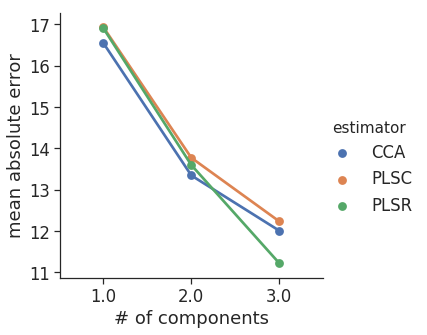

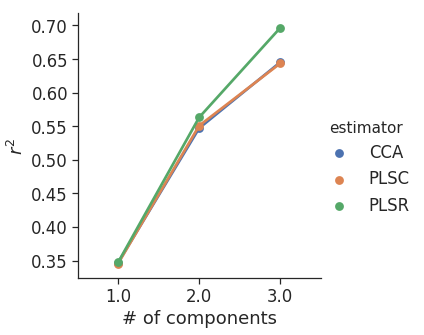

In [16]:
sns.set(font_scale=1.5)
sns.set_style('ticks')

sns.catplot(x = 'nc', y='mae', hue = 'estimator', 
               data=nc_chooser,aspect=1,kind='point')
plt.ylabel('mean absolute error')
plt.xlabel('# of components')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/estimator_selection_cv_mae_rkf.pdf', 
#             bbox_inches='tight')
plt.show()

sns.catplot(x = 'nc', y='r2', hue = 'estimator', 
               data=nc_chooser[nc_chooser.nc<5],
               aspect=1,kind='point')
plt.ylabel('$r^{2}$')
plt.xlabel('# of components')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/estimator_selection_cv_r2_rkf.pdf', 
#             bbox_inches='tight')
plt.show()

#### Cross-validation w/ bootstrapping for CIs

In [19]:
from sklearn.cross_decomposition import PLSCanonical, PLSSVD
from sklearn.model_selection import KFold

ncs = 3
nc_chooser = pandas.DataFrame(index = range(ncs*3), 
                              columns = ['nc', 'estimator', 
                                         'r2','mae'])
i=0
for k,nc in enumerate(range(1,ncs+1)):
    print(nc)
    estimators = {'PLSR': PLSRegression(n_components=nc), 
                  'CCA': CCA(n_components=nc),
                 'PLSC': PLSCanonical(n_components=nc)}
#    nc_chooser.loc[k*3:k*3+2,'nc'] = [nc]*3
    for lab, estimator in estimators.items():
        for it in range(100):
            nind = np.random.choice(tr.index,len(tr.index))
            pred = cross_val_predict(estimator, tr.loc[nind],
                                     tr_y.loc[nind],
                                    groups = gdf.loc[nind].slab_type, 
                                     cv=10)
            nc_chooser.loc[i, 'r2'] = r2_score(y_true=tr_y.loc[nind],
                                               y_pred=pred)
            nc_chooser.loc[i, 'mae'] = mean_absolute_error(y_true=tr_y.loc[nind],
                                                           y_pred=pred)
            nc_chooser.loc[i, 'estimator'] = lab
            nc_chooser.loc[i,'nc'] = nc
            nc_chooser.loc[i,'iter'] = it
            i+=1

1
2
3


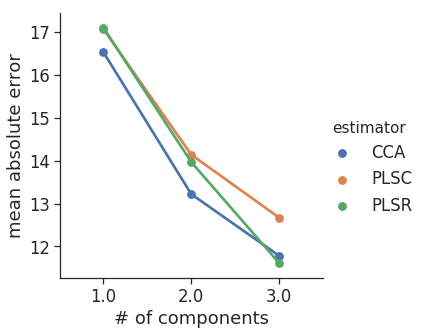

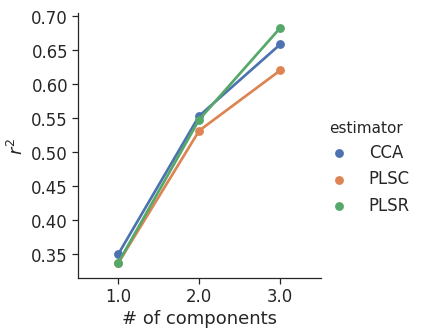

In [20]:
sns.set(font_scale=1.5)
sns.set_style('ticks')

sns.catplot(x = 'nc', y='mae', hue = 'estimator', 
               data=nc_chooser,aspect=1,kind='point')
plt.ylabel('mean absolute error')
plt.xlabel('# of components')
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/estimator_selection_cv_mae_bs_100.pdf', 
           bbox_inches='tight')
plt.show()

sns.catplot(x = 'nc', y='r2', hue = 'estimator', 
               data=nc_chooser[nc_chooser.nc<5],
               aspect=1,kind='point')
plt.ylabel('$r^{2}$')
plt.xlabel('# of components')
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/estimator_selection_cv_r2_bs_100.pdf', 
            bbox_inches='tight')
plt.show()

In [22]:
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(tr,tr_y)

PLSRegression(copy=True, max_iter=500, n_components=3, scale=True, tol=1e-06)

In [62]:
# from importlib import reload
# reload(XD)

In [128]:
# results, comp_sig = XD.evaluate_components(pls_mod, tr, tr_y, n_iterations=1000,
#                                           metric=mean_absolute_error)

finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400
finished iteration 500
finished iteration 600
finished iteration 700
finished iteration 800
finished iteration 900


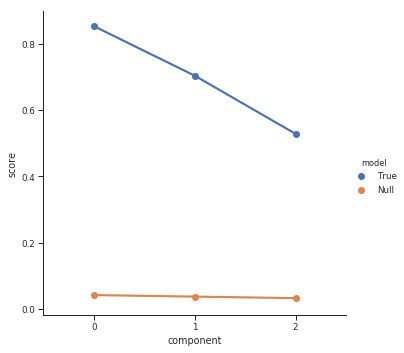

component 0: p = 0.001  ***
component 1: p = 0.001  ***
component 2: p = 0.001  ***


In [63]:
results, comp_sig = XD.evaluate_components(pls_mod, tr, tr_y, n_iterations=1000)

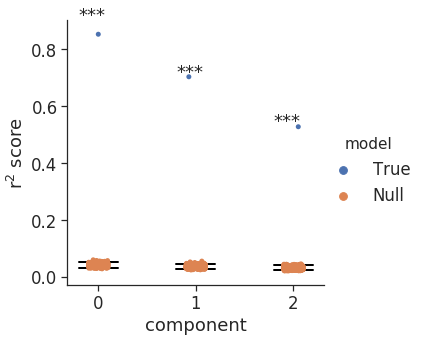

In [64]:
sns.set(font_scale=1.5)
sns.set_style('ticks')
sns.catplot(x='component', y='score', hue='model', data=results)
plt.text(-0.20,0.9,'***')
plt.text(0.80,0.7,'***')
plt.text(1.80,0.53,'***')
plt.ylabel('r$^2$ score')
for c in range(len(results.component.unique())):
    cvals = results[(results.model=='Null')&(results.component==c)
                ].score.sort_values().values
    cmin = cvals[25]
    cmax = cvals[975]
    plt.plot([c-.2,c+.2],[cmin,cmin],lw=2,c='black')
    plt.plot([c-.2,c+.2],[cmax,cmax],lw=2,c='black')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/sig_componentsTR.pdf',
#              bbox_inches='tight')

# Evaluate model

In [23]:
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(tr,tr_y)

PLSRegression(copy=True, max_iter=500, n_components=3, scale=True, tol=1e-06)

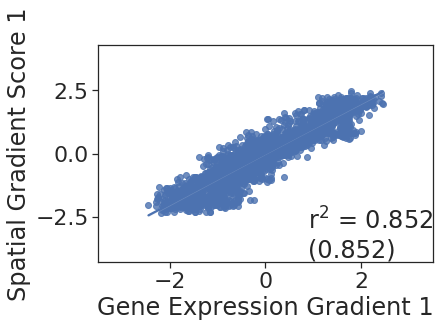

r2 = 0.852481678857959, percent of total = 0.852481678857959


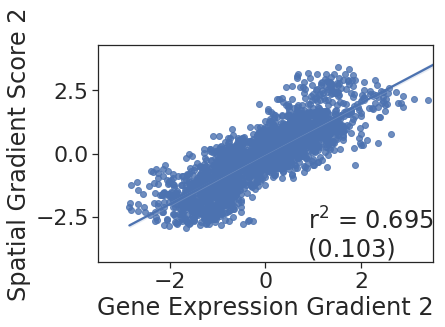

r2 = 0.6950510825550167, percent of total = 0.1025327688064742


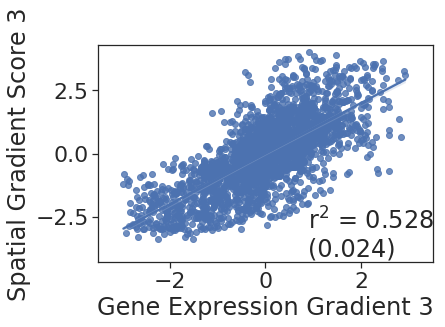

r2 = 0.5276658143587845, percent of total = 0.02373733810752657


In [24]:
# plot component scores
sns.set_context('notebook',font_scale=2)
total = 1
leftover = 1
for i in range(pls_mod.n_components):
    r2 = stats.pearsonr(pls_mod.x_scores_[:,i], pls_mod.y_scores_[:,i])[0]**2
    explained = leftover * r2
    plt.close()
    sns.regplot(pls_mod.x_scores_[:,i], pls_mod.y_scores_[:,i])
    plt.xlim(-3.5,3.5)
    plt.ylim(-4.3,4.3)
    plt.xlabel('Gene Expression Gradient %i'%(i+1))
    plt.ylabel('Spatial Gradient Score %i'%(i+1))
    plt.text(.9,-4.1,'r$^2$ = %s \n(%s)'%(round(r2,3),round(explained,3)))
    plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/principal_correlation_%s.pdf'%i,
               bbox_inches='tight')
    plt.show()
    print('r2 = %s, percent of total = %s'%(r2, explained))
    leftover -= explained


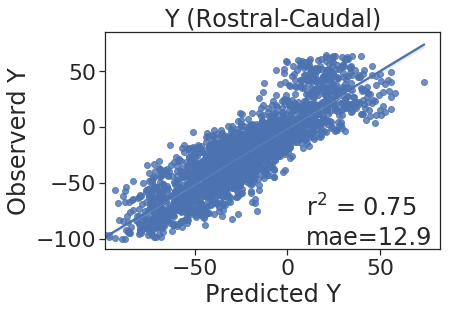

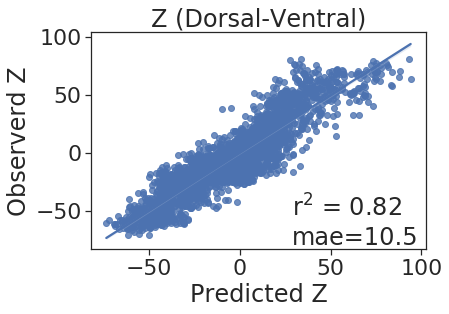

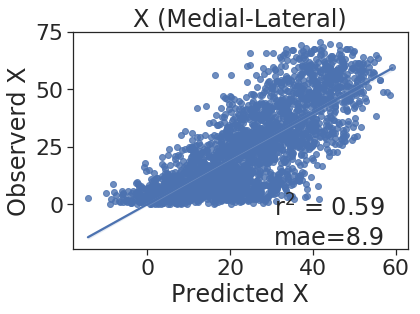

In [67]:
# plot model fit
pred = pls_mod.predict(tr)
labs = dict(zip(['Y','Z','X'],
                ['Rostral-Caudal',
                  'Dorsal-Ventral',
                  'Medial-Lateral']))
for i in range(tr_y.shape[-1]):
    fig = plt.figure(figsize=(6,4))
    ax = fig.add_subplot(111)
    label = tr_y.columns[i][-1].upper()
    sns.regplot(pred[:,i], tr_y[tr_y.columns[i]])
    plt.title('%s (%s)'%(label,labs[label]))
    plt.xlabel('Predicted %s'%label)
    plt.ylabel('Observerd %s'%label)
    
#     tx = np.max(pred[:,i]) - np.min(pred[:,i]) * .4
#     tx = np.min(pred[:,i]) + tx
#     ty = np.max(tr_y[tr_y.columns[i]]
#                ) -np.min(tr_y[tr_y.columns[i]]) * -.5
#     ty = np.min(tr_y[tr_y.columns[i]]) + ty
    r2 = stats.pearsonr(pred[:,i], tr_y[tr_y.columns[i]])[0]**2
    mae = mean_absolute_error(pred[:,i], tr_y[tr_y.columns[i]])
    plt.text(0.6,0.02,
             'r$^2$ = %s \nmae=%s'%(round(r2,2),round(mae,1)),
            transform=ax.transAxes)
#     plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/TestRes_%s.pdf'%label,
#                bbox_inches='tight')
    plt.show()


In [18]:
# plot fit by slab type
preds_df = pandas.concat([pandas.DataFrame(pred, index=tr_y.index), tr_y],axis=1)
preds_df.columns = ['predicted_y', 'predicted_z','predicted_x'] + tr_y.columns.tolist()
preds_df.loc[:,'slab_type'] = gdf.loc[tr.index,'slab_type']
n_components = tr_y.shape[-1]
for i in range(n_components):
    plt.close()
    sns.lmplot(x=preds_df.columns[i], y = preds_df.columns[i+n_components], 
               col = 'slab_type', data = preds_df)
    #plt.title(preds_df.columns[i+n_components])
    plt.show()
    for slab in preds_df.slab_type.unique():
        if not pandas.notnull(slab):
            continue
        r2 = stats.pearsonr(preds_df[preds_df.slab_type==slab][preds_df.columns[i]],
                           preds_df[preds_df.slab_type==slab][preds_df.columns[i+n_components]]
                           )[0]**2
        mae = mean_absolute_error(preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i]],
                                  preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i+n_components]])
        print('%s r2 =%s'%(slab,r2))
        print('%s mae =%s'%(slab,mae))

ValueError: Shape of passed values is (3466, 3), indices imply (2599, 3)

# Test model

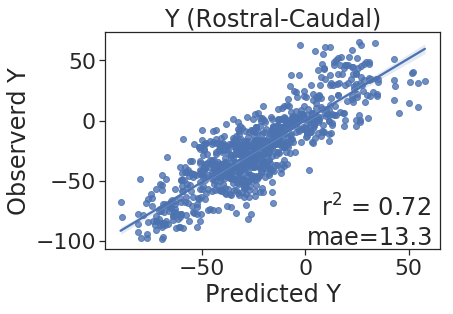

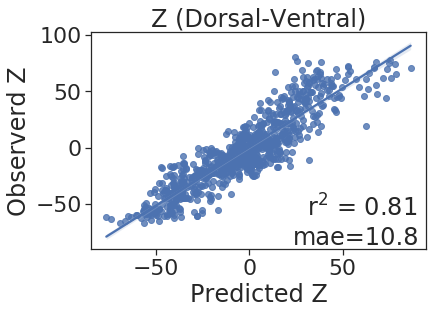

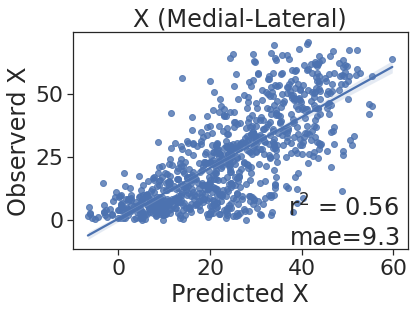

In [25]:
# plot model fit
dims = ['Y','Z','X']
labs = dict(zip(dims,['Rostral-Caudal',
                      'Dorsal-Ventral',
                      'Medial-Lateral']))
te_pred = pls_mod.predict(te)
for i in range(te_y.shape[-1]):
    fig = plt.figure(figsize=(6,4))
    ax = fig.add_subplot(111)
    label = te_y.columns[i][-1].upper()
    sns.regplot(te_pred[:,i], te_y[te_y.columns[i]])
    plt.title('%s (%s)'%(label,labs[label]))
    plt.xlabel('Predicted %s'%label)
    plt.ylabel('Observerd %s'%label)
    
    r2 = stats.pearsonr(te_pred[:,i], te_y[te_y.columns[i]])[0]**2
    mae = mean_absolute_error(te_pred[:,i], te_y[te_y.columns[i]])
    plt.text(0.98,0.02,
             'r$^2$ = %s \nmae=%s'%(round(r2,2),round(mae,1)),
            transform=ax.transAxes,horizontalalignment='right')
    plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/TestRes_%s.pdf'%label,
               bbox_inches='tight')
    plt.show()


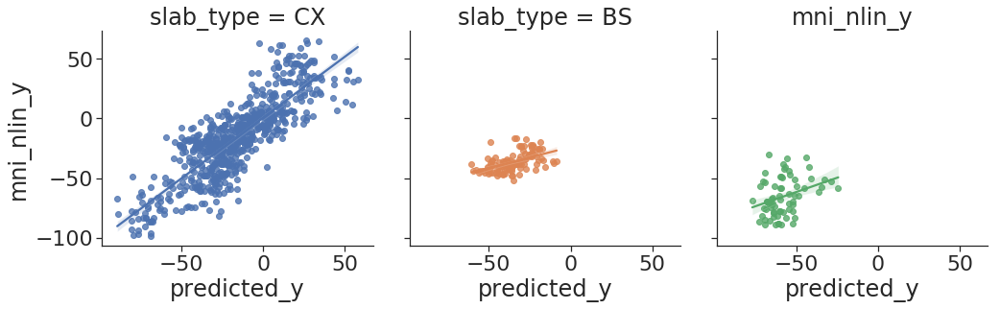

CX r2 =0.6925593394687789
CX mae =14.136499745414813
BS r2 =0.26151720495599795
BS mae =7.510537091822374
CB r2 =0.10465504401531901
CB mae =15.03756645820273


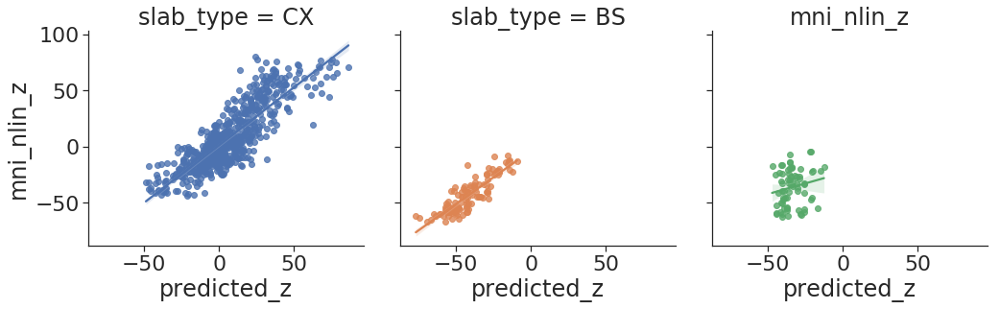

CX r2 =0.7234050976060068
CX mae =11.387145443889832
BS r2 =0.7630499908060788
BS mae =5.863040398791658
CB r2 =0.03435447518195178
CB mae =13.57231509383309


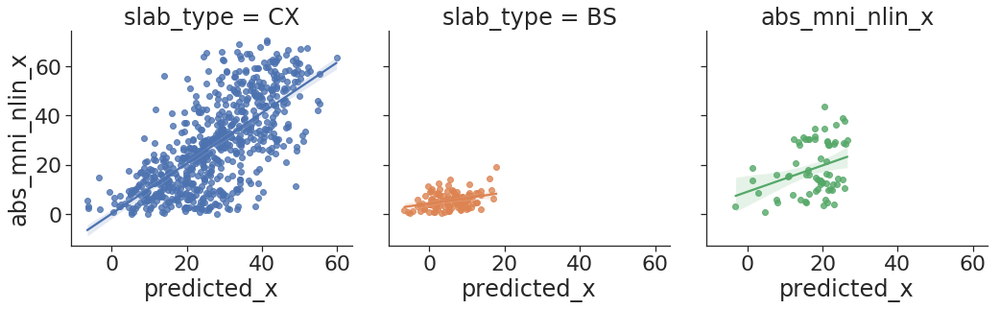

CX r2 =0.48436020149786324
CX mae =10.252622571871466
BS r2 =0.11166457046788507
BS mae =4.112878739886846
CB r2 =0.10230615862539477
CB mae =9.26791193585405


In [27]:
# plot fit by slab type
preds_df = pandas.concat([pandas.DataFrame(te_pred, index=te_y.index), te_y],axis=1)
preds_df.columns = ['predicted_y', 'predicted_z', 'predicted_x'] + te_y.columns.tolist()
preds_df.loc[:,'slab_type'] = gdf.loc[te.index,'slab_type']
n_components = te_y.shape[-1]
for i in range(n_components):
    plt.close()
    sns.lmplot(x=preds_df.columns[i], y = preds_df.columns[i+n_components], hue = 'slab_type', 
               col = 'slab_type', data = preds_df)
    plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/%s_by_slabtype.pdf'%preds_df.columns[i],
              bbox_inches = 'tight')
    plt.title(preds_df.columns[i+n_components])
    plt.show()
    for slab in preds_df.slab_type.unique():
        r2 = stats.pearsonr(preds_df[preds_df.slab_type==slab][preds_df.columns[i]],
                           preds_df[preds_df.slab_type==slab][preds_df.columns[i+n_components]]
                           )[0]**2
        mae = mean_absolute_error(preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i]],
                                  preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i+n_components]])
        print('%s r2 =%s'%(slab,r2))
        print('%s mae =%s'%(slab,mae))

In [28]:
pls_mod = PLSRegression(n_components=3)
full_y = gdf[['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
pls_mod.fit(pca_tfm, full_y)

PLSRegression(copy=True, max_iter=500, n_components=3, scale=True, tol=1e-06)

finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400
finished iteration 500
finished iteration 600
finished iteration 700
finished iteration 800
finished iteration 900


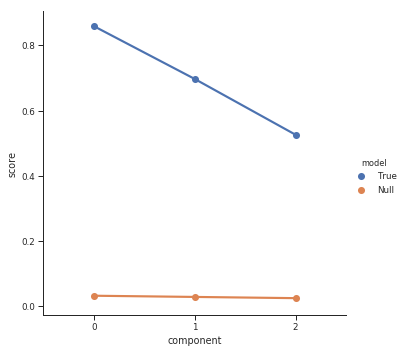

component 0: p = 0.001  ***
component 1: p = 0.001  ***
component 2: p = 0.001  ***


In [72]:
# significant components?
results, comp_sig = XD.evaluate_components(pls_mod, pca_tfm, full_y, n_iterations=1000)

/home/users/jvogel/gxp/lib/python3.5/site-packages/seaborn/categorical.py:3672: UserWarning:

The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.



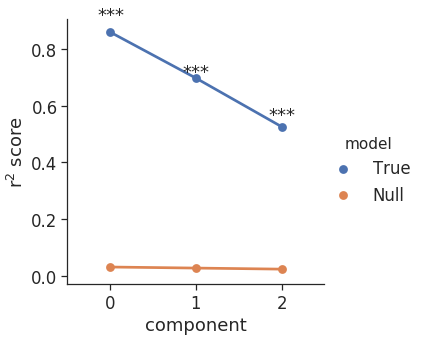

In [73]:
sns.set(font_scale=1.5)
sns.set_style('ticks')
sns.factorplot(x='component', y='score', hue='model', data=results)
plt.text(-0.15,0.9,'***')
plt.text(0.85,0.7,'***')
plt.text(1.85,0.55,'***')
plt.ylabel('r$^2$ score')
#plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/figs/FULLMOD_sig_components.pdf',
#            bbox_inches='tight')
plt.show()

# Build and evaluate model on all data

In [42]:
pls_mod = PLSRegression(n_components=3)
full_y = gdf[['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
pls_mod.fit(pca_tfm, full_y)

PLSRegression(copy=True, max_iter=500, n_components=3, scale=True, tol=1e-06)

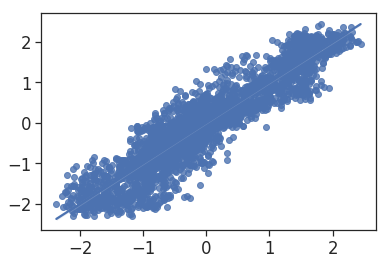

r2 = 0.8588457084271366, percent of total = 0.8588457084271366


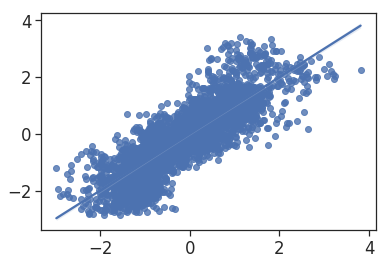

r2 = 0.7001346072553593, percent of total = 0.09882700449277519


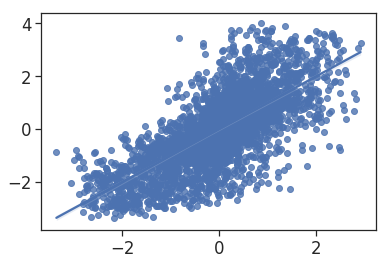

r2 = 0.5204433306237518, percent of total = 0.022028954264228812


In [43]:
pls_mod.fit(pca_tfm, gdf[['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']])
# plot component scores
total = 1
leftover = 1
for i in range(pls_mod.n_components):
    plt.close()
    sns.regplot(pls_mod.x_scores_[:,i], pls_mod.y_scores_[:,i])
    plt.show()
    r2 = stats.pearsonr(pls_mod.x_scores_[:,i], pls_mod.y_scores_[:,i])[0]**2
    explained = leftover * r2
    print('r2 = %s, percent of total = %s'%(r2, explained))
    leftover = leftover - explained

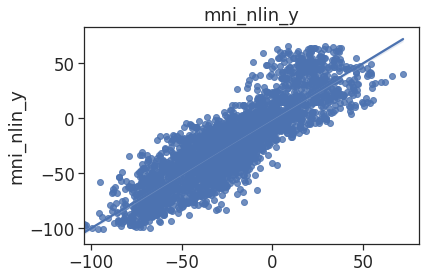

(0.8607841336438007, 0.0)
12.97360810872879


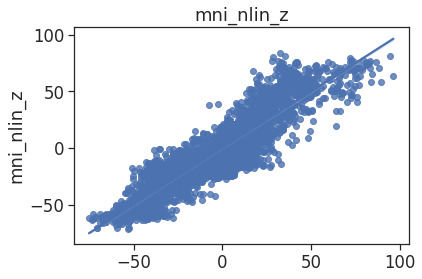

(0.9081671594422588, 0.0)
10.354763727931493


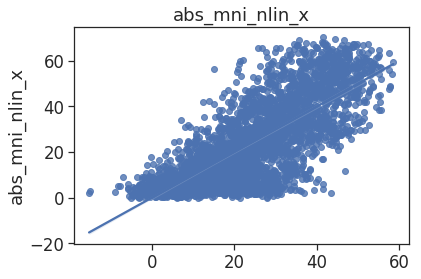

(0.7682712972316166, 0.0)
8.901578431013675


In [44]:
# plot model fit
pred = pls_mod.predict(pca_tfm)
for i in range(full_y.shape[-1]):
    plt.close()
    sns.regplot(pred[:,i], full_y[full_y.columns[i]])
    plt.title(full_y.columns[i])
    plt.show()
    print(stats.pearsonr(pred[:,i], full_y[full_y.columns[i]]))
    print(mean_absolute_error(pred[:,i], full_y[full_y.columns[i]]))

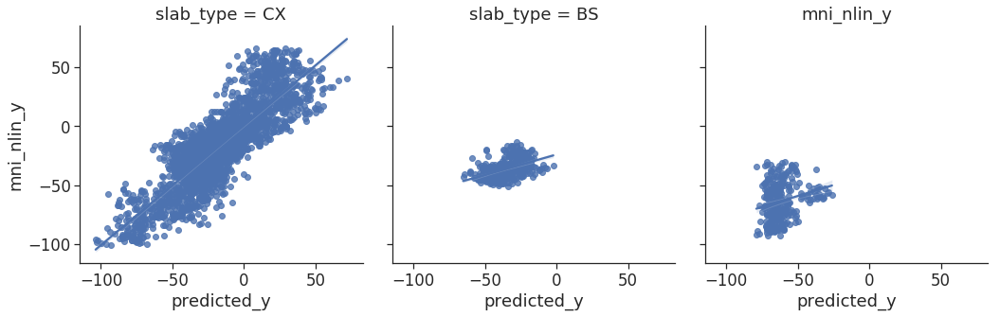

CX r2 =0.7143866242838418
CX mae =47.05655225933904
BS r2 =0.2648869923320552
BS mae =41.52461540152346
CB r2 =0.05635420583158333
CB mae =79.9693773809456


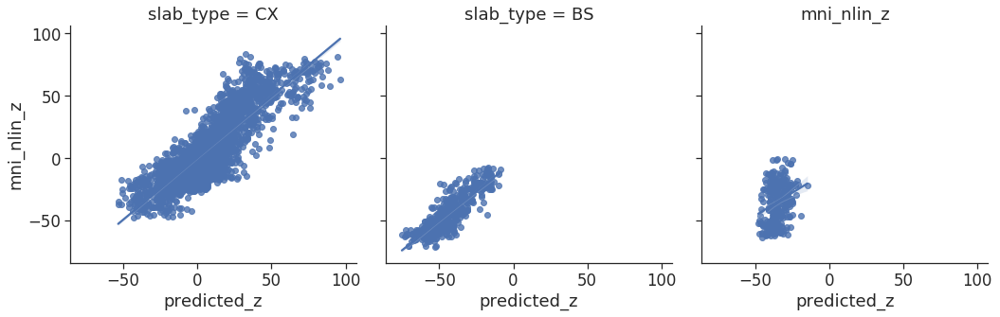

CX r2 =0.7369084094682804
CX mae =36.82528782705162
BS r2 =0.7433671226939075
BS mae =10.834404218498511
CB r2 =0.0704270979519689
CB mae =28.8931534661978


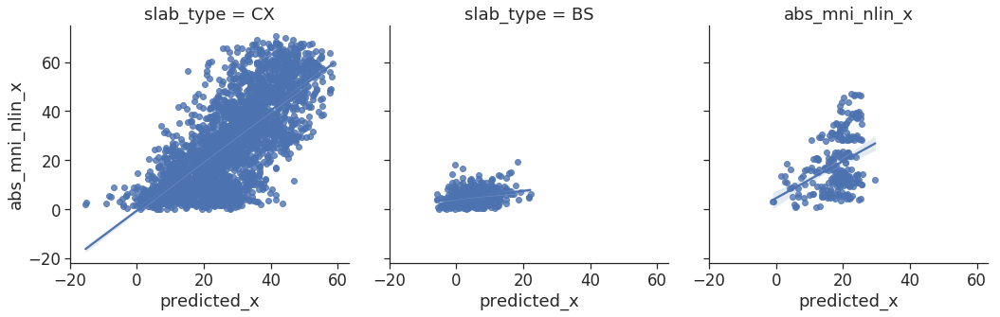

CX r2 =0.5205664963413996
CX mae =30.578626193891644
BS r2 =0.05989461530481029
BS mae =48.792028920112024
CB r2 =0.13058537244866647
CB mae =53.38890907871661


In [45]:
# plot fit by slab type
preds_df = pandas.concat([pandas.DataFrame(pred, index=full_y.index), full_y],axis=1)
preds_df.columns = ['predicted_y', 'predicted_z', 'predicted_x'] + full_y.columns.tolist()
preds_df.loc[:,'slab_type'] = gdf.loc[pca_tfm.index,'slab_type']
n_components = full_y.shape[-1]
for i in range(n_components):
    plt.close()
    sns.lmplot(x=preds_df.columns[i], y = preds_df.columns[i+n_components], 
               col = 'slab_type', data = preds_df)
    plt.title(preds_df.columns[i+n_components])
    plt.show()
    for slab in preds_df.slab_type.unique():
        r2 = stats.pearsonr(preds_df[preds_df.slab_type==slab][preds_df.columns[i]],
                           preds_df[preds_df.slab_type==slab][preds_df.columns[i+n_components]]
                           )[0]**2
        mae = mean_absolute_error(preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i]],
                                  preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i+2]])
        print('%s r2 =%s'%(slab,r2))
        print('%s mae =%s'%(slab,mae))

# Visualize predictions

In [31]:
preds_df.loc[:,'structure'] = gdf.structure_acronym.values

In [36]:
g2=pandas.read_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/MAIN_gcx_wholebrain_info_W_BRAIN_DIVISIONS.csv',
                  index_col=0)

In [37]:
g2 = g2.loc[gdf[gdf.columns[0]].values]

In [39]:
bd2 = ['Temporal' if x == 'Limbic' else\
      'Subcortex' if x in ['Thalamus','Striatum',
                           'Hypothalamus','Forebrain',
                           'Other_Dien'] else\
      'Brainstem' if x in ['Medulla','Pons',
                           'Tegmentum','Tectum'] else\
      'Frontal' if x in ['Anterior_Cingulate','Insula'] else\
      'Parietal' if x == 'Posterior_Cingulate' else\
      'Cerebellum' if x == 'DCN' else\
      x for x in g2.brain_divison.values]
g2.loc[:,'BD2'] = bd2

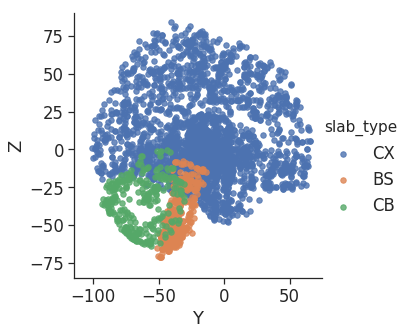

In [34]:
sns.set_context('notebook',font_scale=1.5)
sns.lmplot('mni_nlin_y', 'mni_nlin_z', hue = 'slab_type', data=gdf, fit_reg=False, 
           scatter_kws={"s": 30})
plt.xlabel('Y')
plt.ylabel('Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_YZ.pdf',
           bbox_inches='tight')

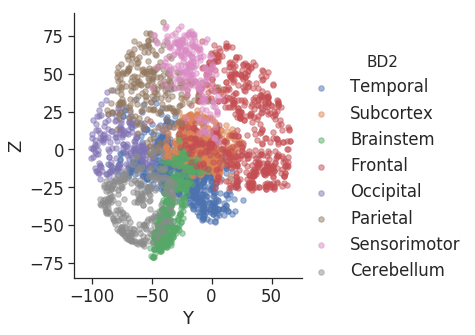

In [40]:
sns.set_context('notebook',font_scale=1.5)
sns.lmplot('mni_nlin_y', 'mni_nlin_z', hue = 'BD2', data=g2, 
           fit_reg=False, 
           scatter_kws={"s": 30,'alpha':0.5})
plt.xlabel('Y')
plt.ylabel('Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_YZ_div.pdf',
           bbox_inches='tight')

Text(58.37693064236113, 0.5, 'Z')

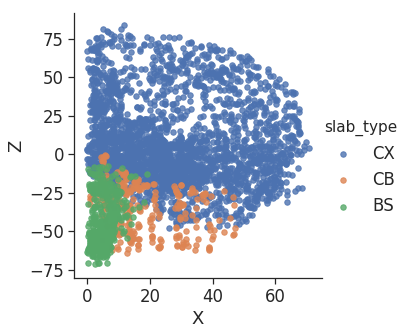

In [87]:
sns.lmplot('abs_mni_nlin_x', 'mni_nlin_z', hue = 'slab_type', data=gdf, fit_reg=False, 
           scatter_kws={"s": 30})
plt.xlabel('X')
plt.ylabel('Z')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/brain_plot_XZ.pdf',
#            bbox_inches='tight')

Text(78.36078684895834, 0.5, 'Z')

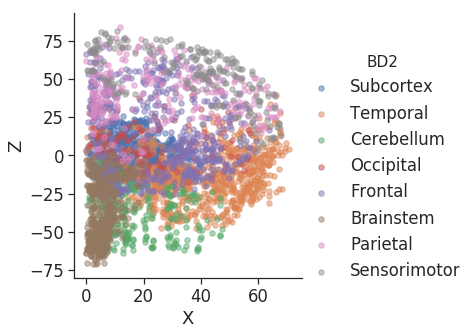

In [88]:
sns.lmplot('abs_mni_nlin_x', 'mni_nlin_z', hue = 'BD2', data=g2, 
           fit_reg=False, 
           scatter_kws={"s": 30,'alpha':0.5})
plt.xlabel('X')
plt.ylabel('Z')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/brain_plot_XZ_div.pdf',
#            bbox_inches='tight')

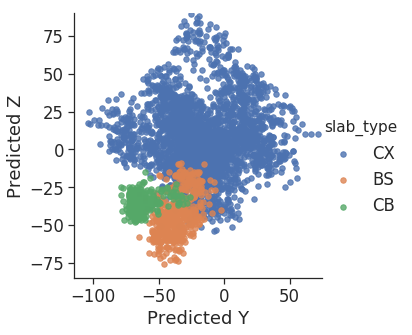

In [46]:
sns.lmplot('predicted_y', 'predicted_z', hue = 'slab_type', data=preds_df, 
           fit_reg=False, scatter_kws={"s": 30})
plt.xlabel('Predicted Y')
plt.ylabel('Predicted Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_YZ_pred.pdf',
           bbox_inches='tight')

In [47]:
preds_df.loc[:,'BD2'] = bd2

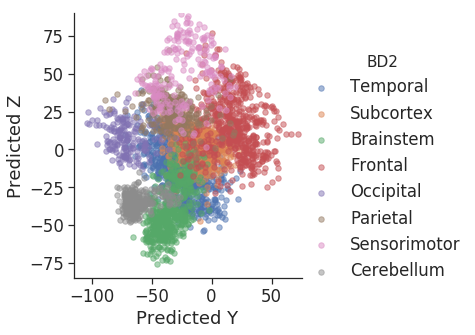

In [48]:
sns.lmplot('predicted_y', 'predicted_z', hue = 'BD2', data=preds_df, 
           fit_reg=False, 
           scatter_kws={"s": 30,'alpha':0.5})
plt.xlabel('Predicted Y')
plt.ylabel('Predicted Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_YZ_pred_div.pdf',
           bbox_inches='tight')

Text(58.37693064236113, 0.5, 'Predicted Z')

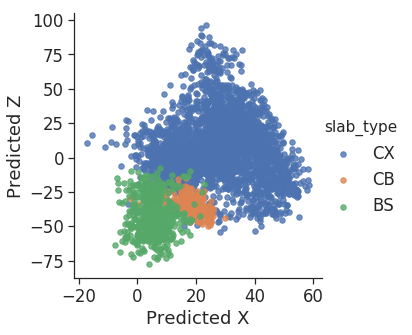

In [92]:
sns.lmplot('predicted_x', 'predicted_z', hue = 'slab_type', data=preds_df, 
           fit_reg=False, scatter_kws={"s": 30})
plt.xlabel('Predicted X')
plt.ylabel('Predicted Z')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/brain_plot_XZ_pred.pdf',
#            bbox_inches='tight')

Text(78.36078684895834, 0.5, 'Predicted Z')

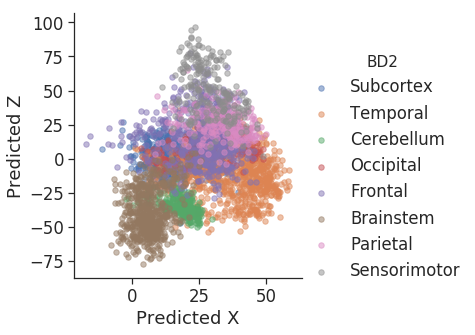

In [93]:
sns.lmplot('predicted_x', 'predicted_z', hue = 'BD2', data=preds_df, 
           fit_reg=False, scatter_kws={"s": 30,'alpha':0.5})
plt.xlabel('Predicted X')
plt.ylabel('Predicted Z')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/brain_plot_XZ_pred_div.pdf',
#            bbox_inches='tight')

In [49]:
preds_df.loc[:,'error_y'] = abs(preds_df.predicted_y.values -\
                                preds_df.mni_nlin_y.values)
preds_df.loc[:,'error_z'] = abs(preds_df.predicted_z.values -\
                                preds_df.mni_nlin_z.values)
preds_df.loc[:,'error_x'] = abs(preds_df.predicted_x.values -\
                                preds_df.abs_mni_nlin_x.values)
preds_df.loc[:,'total_error'] = preds_df[['error_y',
                                          'error_z',
                                          'error_x']].mean(1).values
ecols = [x for x in preds_df.columns if 'error' in x]
for ecol in ecols:
    cut = pandas.cut(preds_df[ecol],10)
    code = dict(zip(np.unique(cut),range(1,len(np.unique(cut))+1)))
    preds_df.loc[:,'%s_cat'%ecol] = [code[x] for x in cut]

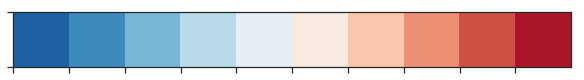

In [95]:
sns.palplot(sns.color_palette('RdBu_r',10))
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/brain_plot_error_colors.pdf',
#             bbox_inches='tight')

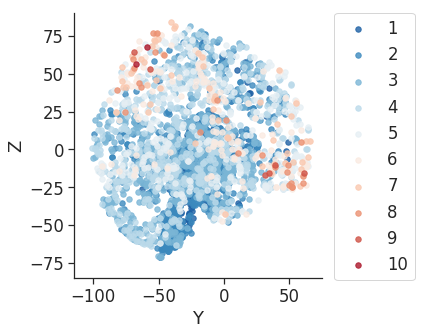

In [50]:
sns.lmplot('mni_nlin_y', 'mni_nlin_z', 
           hue = 'total_error_cat',legend=False, 
           data=preds_df, fit_reg=False, 
           scatter_kws={"s": 30},
          palette='RdBu_r')
plt.xlabel('Y')
plt.ylabel('Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_error_YZ.pdf',
            bbox_inches='tight')

In [51]:
code

{Interval(0.403, 4.457, closed='right'): 1,
 Interval(4.457, 8.469, closed='right'): 2,
 Interval(8.469, 12.482, closed='right'): 3,
 Interval(12.482, 16.495, closed='right'): 4,
 Interval(16.495, 20.508, closed='right'): 5,
 Interval(20.508, 24.521, closed='right'): 6,
 Interval(24.521, 28.534, closed='right'): 7,
 Interval(28.534, 32.547, closed='right'): 8,
 Interval(32.547, 36.56, closed='right'): 9,
 Interval(36.56, 40.573, closed='right'): 10}

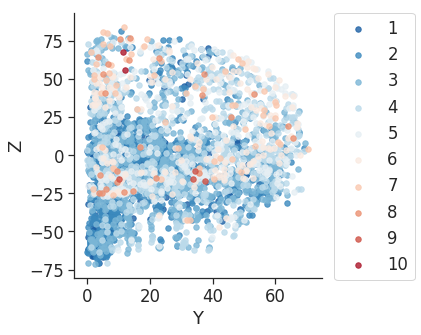

In [101]:
sns.lmplot('abs_mni_nlin_x', 'mni_nlin_z', 
           hue = 'total_error_cat',legend=False, 
           data=preds_df, fit_reg=False, 
           scatter_kws={"s": 30},
          palette='RdBu_r')
plt.xlabel('Y')
plt.ylabel('Z')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/brain_plot_error_XZ.pdf',
#             bbox_inches='tight')

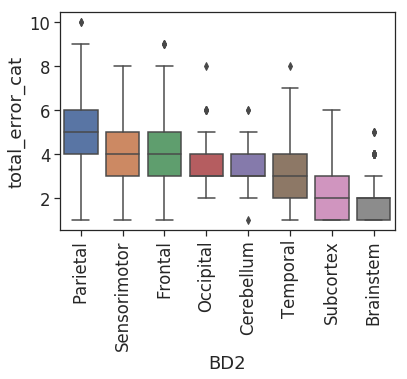

In [52]:
order = pandas.pivot_table(preds_df,index='BD2',
                           values='total_error_cat'
                          ).sort_values('total_error_cat',
                                        ascending=False).index
g = sns.boxplot(x='BD2',y='total_error_cat',data=preds_df,order=order)
g.set_xticklabels(g.get_xticklabels(),rotation=90)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_error_by_region.pdf',
            bbox_inches='tight')

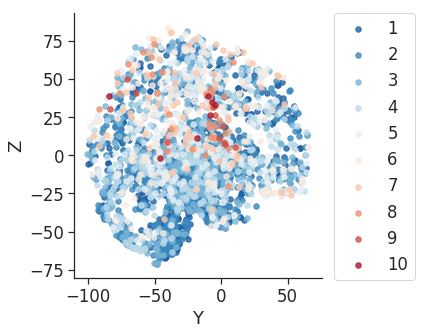

In [103]:
sns.lmplot('mni_nlin_y', 'mni_nlin_z', 
           hue = 'error_x_cat',legend=False, 
           data=preds_df, fit_reg=False, 
           scatter_kws={"s": 30},
          palette='RdBu_r')
plt.xlabel('Y')
plt.ylabel('Z')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/figs/ADDX/brain_plot.pdf',
#            bbox_inches='tight')

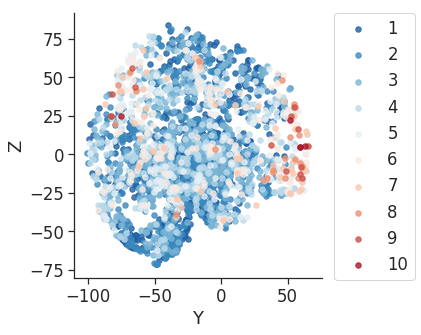

In [104]:
sns.lmplot('mni_nlin_y', 'mni_nlin_z', 
           hue = 'error_y_cat',legend=False, 
           data=preds_df, fit_reg=False, 
           scatter_kws={"s": 30},
          palette='RdBu_r')
plt.xlabel('Y')
plt.ylabel('Z')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/figs/ADDX/brain_plot.pdf',
#            bbox_inches='tight')

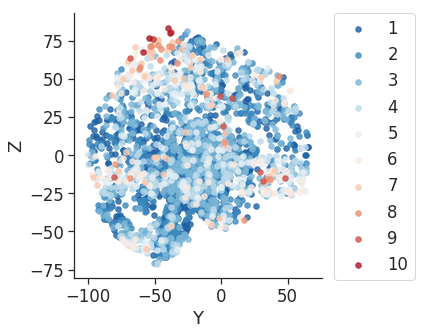

In [105]:
sns.lmplot('mni_nlin_y', 'mni_nlin_z', 
           hue = 'error_z_cat',legend=False, 
           data=preds_df, fit_reg=False, 
           scatter_kws={"s": 30},
          palette='RdBu_r')
plt.xlabel('Y')
plt.ylabel('Z')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/figs/ADDX/brain_plot.pdf',
#            bbox_inches='tight')

Text(60.86837161458335, 0.5, 'Predicted Y')

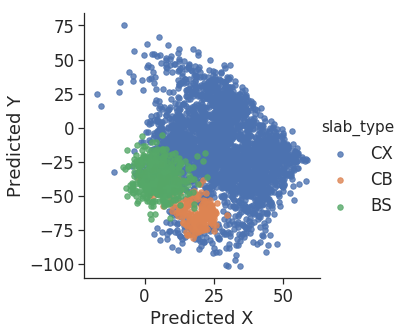

In [106]:
sns.lmplot('predicted_x', 'predicted_y', hue = 'slab_type', data=preds_df, 
           fit_reg=False, scatter_kws={"s": 30})
plt.xlabel('Predicted X')
plt.ylabel('Predicted Y')
#plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/figs/brain_plot_predicted.pdf',
#           bbox_inches='tight')

In [53]:
labs = [0 if gdf.loc[x,'slab_type'] == 'CX' else 1 if gdf.loc[x,'slab_type'] == 'BS' else 2 for x in gdf.index]
embedding = gdf[['abs_mni_nlin_x','mni_nlin_y','mni_nlin_z']].values

lmap = dict(zip(np.unique(labs),gdf.slab_type.unique()))
traces = list()
for lab in np.unique(labs):
    l_index = [x for x in range(len(labs)) if labs[x] == lab]
    l_embed = embedding[l_index]
#     color_str = str(int('0x' + color_dict[lab][1:3].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][3:5].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][5:7].upper(),16))
    #color_str = plt.cm.tab10.colors[lab]
    color_str = 'rgba %s'%str(tuple([x - 0.0000001 for x in plt.cm.tab10(lab) if x > 0]))
    temp_trace = plotly.graph_objs.Scatter3d(x=l_embed[:,0],
                                            y = l_embed[:,1],
                                            z = l_embed[:,2],
                                            name = lmap[lab],
                                            mode = 'markers',
                                            marker = dict(size=3,
                                                          color=color_str
                                                         )
                                            )
    traces.append(temp_trace)

layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=traces, layout=layout)
plotly.offline.plot(fig, filename='/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain.html')
    

'/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain.html'

In [54]:
labs = [0 if gdf.loc[x,'slab_type'] == 'CX' else 1 if gdf.loc[x,'slab_type'] == 'BS' else 2 for x in gdf.index]
embedding = preds_df[['predicted_x','predicted_y','predicted_z']].values

lmap = dict(zip(np.unique(labs),gdf.slab_type.unique()))
traces = list()
for lab in np.unique(labs):
    l_index = [x for x in range(len(labs)) if labs[x] == lab]
    l_embed = embedding[l_index]
#     color_str = str(int('0x' + color_dict[lab][1:3].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][3:5].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][5:7].upper(),16))
    #color_str = plt.cm.tab10.colors[lab]
    color_str = 'rgba %s'%str(tuple([x - 0.0000001 for x in plt.cm.tab10(lab) if x > 0]))
    temp_trace = plotly.graph_objs.Scatter3d(x=l_embed[:,0],
                                            y = l_embed[:,1],
                                            z = l_embed[:,2],
                                            name = lmap[lab],
                                            mode = 'markers',
                                            marker = dict(size=3,
                                                          color=color_str
                                                         )
                                            )
    traces.append(temp_trace)

layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=traces, layout=layout)
plotly.offline.plot(fig, filename='/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/corpredicted_brain.html')
    

'/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/corpredicted_brain.html'

# Examine components

In [108]:
#reload(XD)

In [55]:
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(pca_tfm, full_y)
bsrx, bsry, allx_bs, ally_bs = XD.bootstrap_features(PLSRegression(n_components=3), 
                                                  pls_mod, 
                                                  pca_tfm, 
                                                  full_y, 
                                                  n_iterations=1000)

finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400
finished iteration 500
finished iteration 600
finished iteration 700
finished iteration 800
finished iteration 900


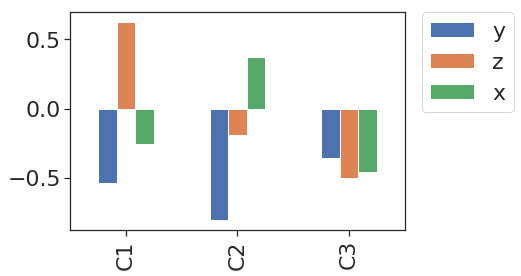

In [56]:
sns.set_context('notebook',font_scale=2)
g = pandas.DataFrame(pls_mod.y_weights_, 
                 index=['component %s'%x for x in range(3)],
                 columns=['y','z','x']).plot.bar()
g.set_xticklabels(['C1','C2','C3'])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/y_weights.pdf',
            bbox_inches='tight')

In [57]:
plotr = pandas.concat([pandas.Series(allx_bs[0].values.flatten()),
                       #pandas.Series(list(range(100))*500)],
                       pandas.Series(list(range(100))*1000)],
                      axis=1)
plotr.columns = ['Loading','Component']

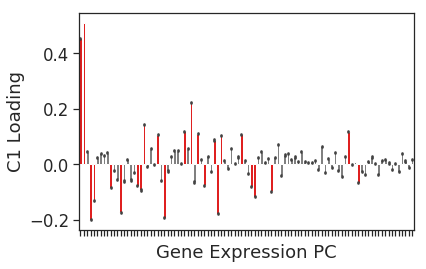

In [58]:
sns.set(font_scale=1.5)
sns.set_style('ticks')
colors = ['Red' if x else 'Grey' for x in multipletests(bsrx['p'].loc[0], method='fdr_bh')[0]]
g=sns.barplot(x='Component', y='Loading', data=plotr, palette=colors)
plt.xlabel('Gene Expression PC')
plt.ylabel('C1 Loading')
g.set_xticklabels([None for x in range(100)])
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C1_XWeights.pdf',
            bbox_inches='tight')

In [59]:
sigs = multipletests(bsrx['p'].loc[0], method='fdr_bh')[0]
new_loading = [pls_mod.x_loadings_[x,0] if sigs[x] else 0 for x in range(pca_tfm.shape[-1])]

In [60]:
newc1 = np.dot(pcamod.components_.T, new_loading)
newc1 = pandas.concat([pandas.Series(newc1), pandas.Series(bigdf.columns)],
                      axis=1)

In [61]:
probe_index = pandas.DataFrame(probes,copy=True)
probe_index.index = probe_index.gene_symbol.values
for i,row in newc1.iterrows():
    if row['gene_symbol'] in probe_index.index:
        nm = probe_index.loc[row['gene_symbol'],'gene_name']
        if type(nm) == pandas.core.series.Series:
            newc1.loc[i,'gene_name'] = nm.values[0]
        elif pandas.notnull(nm):
            newc1.loc[i,'gene_name'] = nm

In [80]:
newc1.sort_values(0,ascending=False)

,0,gene_symbol,gene_name
12899,0.035269,STON1,stonin 1
10410,0.033730,PRPH,peripherin
7492,0.033172,LXN,latexin
1865,0.031342,CAVIN3,NaN
12808,0.031009,ST3GAL6,"ST3 beta-galactoside alpha-2,3-sialyltransfera..."
12049,0.029831,SLC17A6,solute carrier family 17 (sodium-dependent ino...
9922,0.029345,PLCXD3,"phosphatidylinositol-specific phospholipase C,..."
9428,0.027017,PAX8,paired box 8
1774,0.026875,CAMK2N2,calcium/calmodulin-dependent protein kinase II...
13667,0.026082,TMEM255A,NaN


In [62]:
newc1.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/GCORR_C1_genelist.csv')

In [63]:
allcomps = pandas.DataFrame(newc1,copy=True)
allcomps.columns = ['C1','gene_symbol','gene_name']

In [66]:
c1_xp = hap.get_gene_vector(pandas.DataFrame(bigdf.T), newc1[0])

In [67]:
input_coords = []
for i,row in gdf.iterrows():
    input_coords.append(hap.convert_coords([round(int(row['mni_nlin_x'])), 
                                        round(int(row['mni_nlin_y'])), 
                                        round(int(row['mni_nlin_z']))], 'xyz'))
nm = 'NEUR608_IMG_c1'
mni_pth = '/home/users/jvogel/Science/templates/templates/MNI152_T1_1mm_brain.nii'
wdir = '/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/'
gcx_img = hap.make_expression_image(c1_xp, input_coords, mni_pth, wdir, nm, 5, return_img=True)

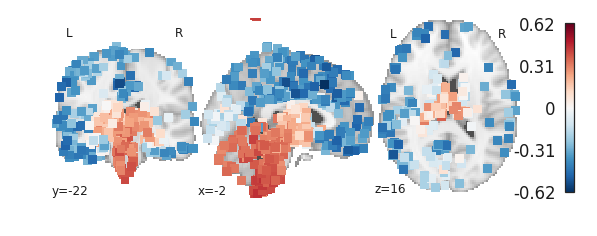

In [68]:
plotting.plot_stat_map(gcx_img,cut_coords=[-2,-22,16],
                       cmap='RdBu_r',
                       draw_cross=False)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigsC1_BrainGxp.pdf',
           bbox_inches='tight')



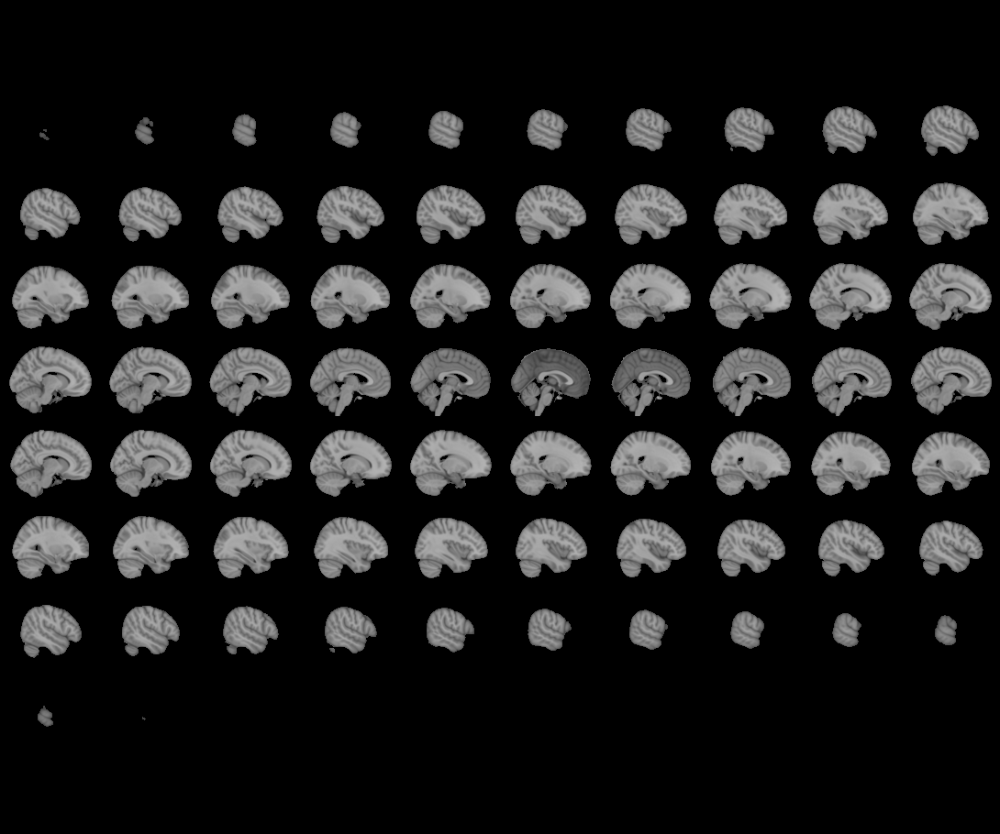
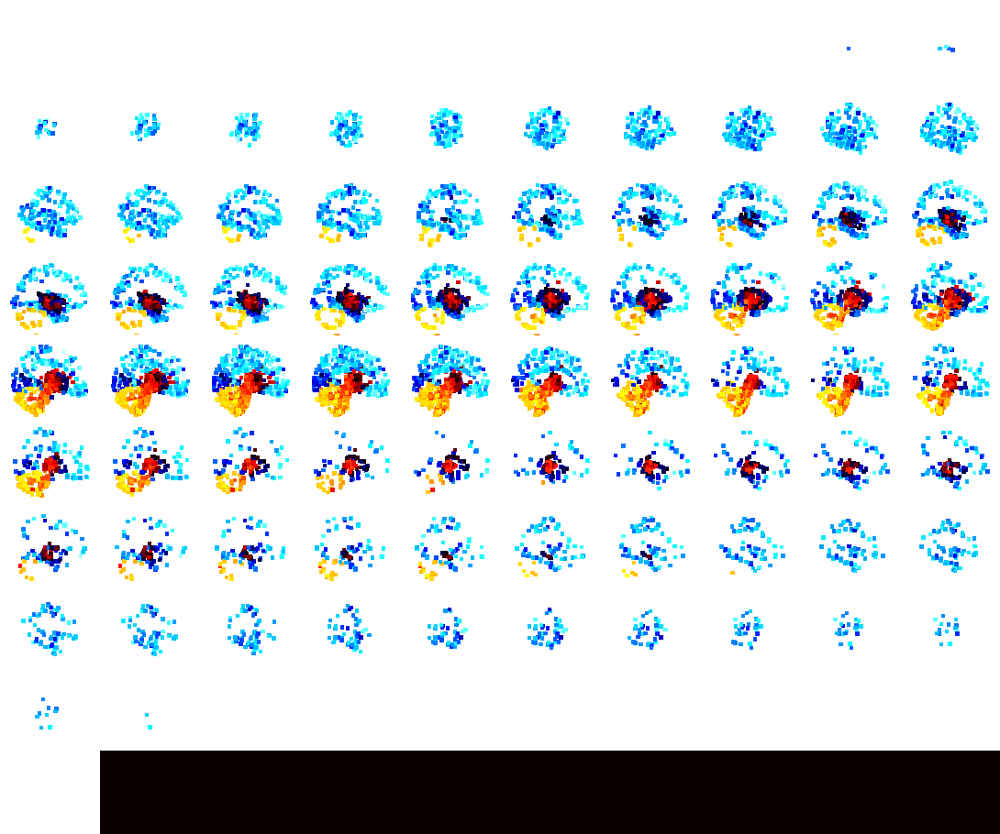

In [33]:
plotting.view_img(gcx_img)

In [69]:
gcx_img.to_filename('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C1_XWeights.nii.gz')

In [70]:
plotr = pandas.concat([pandas.Series(allx_bs[1].values.flatten()),
                       pandas.Series(list(range(100))*1000)],
                      axis=1)
plotr.columns = ['Loading','Component']

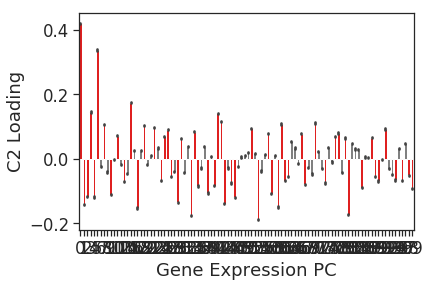

In [71]:
colors = ['Red' if x < 0.05 else 'Grey' for x in bsrx['p'].loc[1]]
sns.barplot(x='Component', y='Loading', data=plotr, palette=colors)
plt.xlabel('Gene Expression PC')
plt.ylabel('C2 Loading')
g.set_xticklabels([None for x in range(100)])
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_XWeights.pdf',
            bbox_inches='tight')

In [84]:
bsrx['p']

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.001,0.001,0.007,0.071,0.002,0.001,0.002,0.45,0.002,0.001,...,0.365,0.317,0.389,0.28,0.401,0.27,0.495,0.282,0.208,0.234
1,0.001,0.001,0.003,0.001,0.001,0.001,0.001,0.001,0.052,0.008,...,0.003,0.186,0.017,0.098,0.142,0.001,0.015,0.207,0.001,0.003
2,0.001,0.051,0.018,0.362,0.001,0.01,0.428,0.001,0.43,0.001,...,0.001,0.298,0.354,0.496,0.346,0.017,0.185,0.054,0.118,0.249


In [86]:
# Need to modify this because for some reason nothing is significant


# sigs = multipletests(bsrx['p'].loc[1], method='fdr_bh')[0]
# new_loading = [pls_mod.x_loadings_[x,1] if not sigs[x] else 0 for x in range(pca_tfm.shape[-1])] # changed to if not here
# newc2 = np.dot(pcamod.components_.T, new_loading)
# newc2 = pandas.concat([pandas.Series(newc2), probes[['gene_symbol','gene_name']]], axis=1)

# UPDATE: The problem was the scores were sometimes arbitrarily inverted

In [72]:
sigs = multipletests(bsrx['p'].loc[1], method='fdr_bh')[0]
new_loading = [pls_mod.x_loadings_[x,1] if sigs[x] else 0 for x in range(pca_tfm.shape[-1])]
newc2 = np.dot(pcamod.components_.T, new_loading)
newc2 = pandas.concat([pandas.Series(newc2), pandas.Series(bigdf.columns)],
                      axis=1)
for i,row in newc2.iterrows():
    if row['gene_symbol'] in probe_index.index:
        nm = probe_index.loc[row['gene_symbol'],'gene_name']
        if type(nm) == pandas.core.series.Series:
            newc2.loc[i,'gene_name'] = nm.values[0]
        elif pandas.notnull(nm):
            newc2.loc[i,'gene_name'] = nm

In [93]:
newc2.sort_values(0,ascending=False)

,0,gene_symbol,gene_name
10446,0.046736,PRRX1,paired related homeobox 1
13355,0.043314,TGFBI,"transforming growth factor, beta-induced, 68kDa"
489,0.040414,AMDHD1,amidohydrolase domain containing 1
14227,0.039789,TUNAR,NaN
13050,0.037448,SYT10,synaptotagmin X
5500,0.036839,HCN4,hyperpolarization activated cyclic nucleotide-...
2114,0.034467,CD6,CD6 molecule
497,0.034045,AMIGO2,adhesion molecule with Ig-like domain 2
15090,0.032450,ZMYND10,"zinc finger, MYND-type containing 10"
9531,0.032271,PCSK5,proprotein convertase subtilisin/kexin type 5


In [73]:
newc2.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/GCorr_C2_genelist.csv')

In [74]:
allcomps.loc[:,'C2'] = newc2[newc2.columns[0]].values

In [75]:
c2_xp = hap.get_gene_vector(pandas.DataFrame(bigdf.T), newc2[0])

In [76]:
gdf.loc[:,'C2_Expression'] = c2_xp

In [77]:
input_coords = []
for i,row in gdf.iterrows():
    input_coords.append(hap.convert_coords([round(int(row['mni_nlin_x'])), 
                                        round(int(row['mni_nlin_y'])), 
                                        round(int(row['mni_nlin_z']))], 'xyz'))
nm = 'NEUR608_IMG_c2'
mni_pth = '/home/users/jvogel/Science/templates/templates/MNI152_T1_1mm_brain.nii'
wdir = '/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/'
gcx_img = hap.make_expression_image(c2_xp, input_coords, mni_pth, wdir, nm, 5, return_img=True)

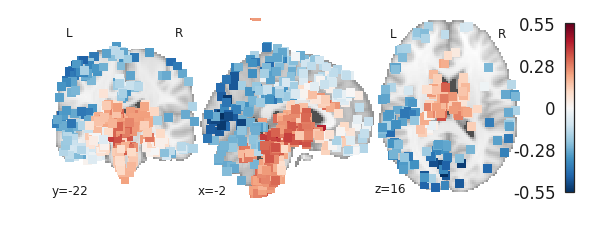

In [78]:
plotting.plot_stat_map(gcx_img,cut_coords=[-2,-22,16],
                       cmap='RdBu_r',
                       draw_cross=False)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_BrainGxp.pdf',
            bbox_inches='tight')


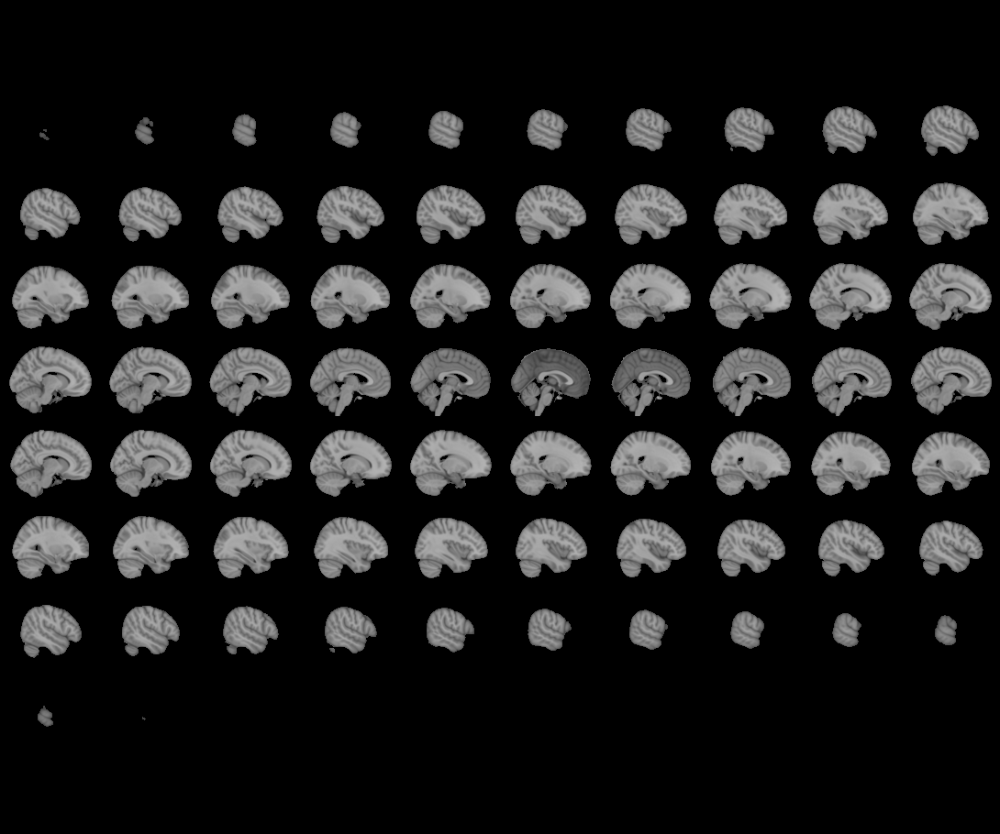
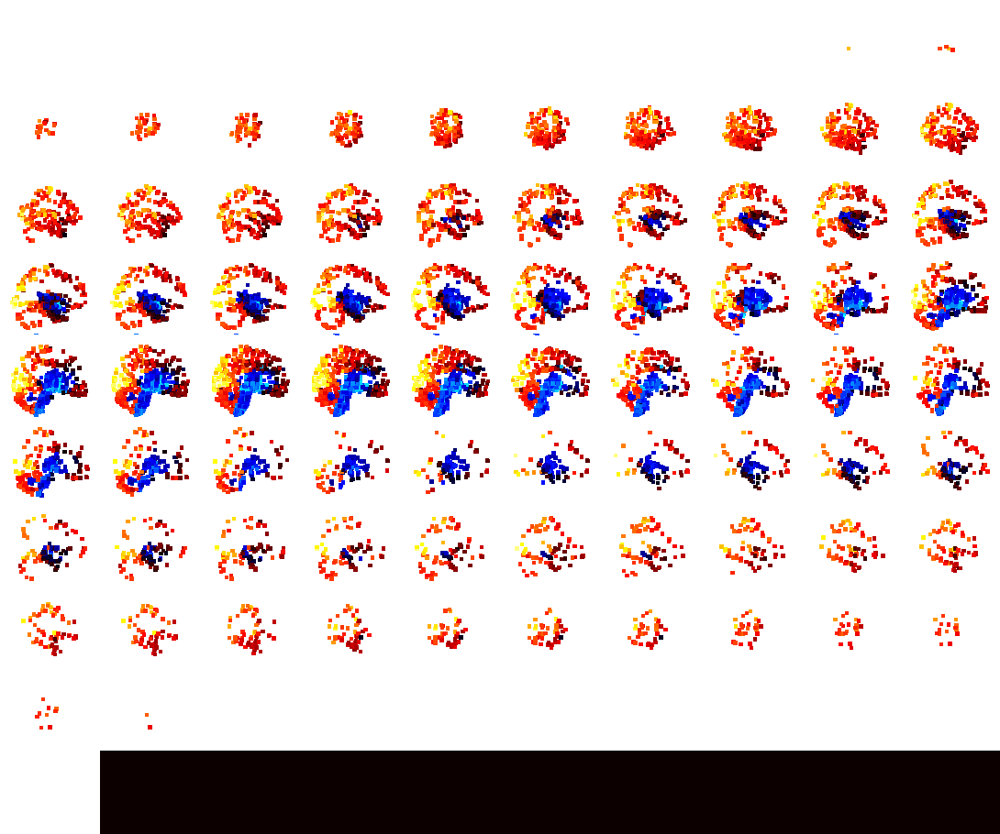

In [100]:
plotting.view_img(gcx_img)

In [79]:
gcx_img.to_filename('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_XWeights.nii.gz')

In [80]:
plotr = pandas.concat([pandas.Series(allx_bs[2].values.flatten()),
                       pandas.Series(list(range(100))*1000)],
                      axis=1)
plotr.columns = ['Loading','Component']

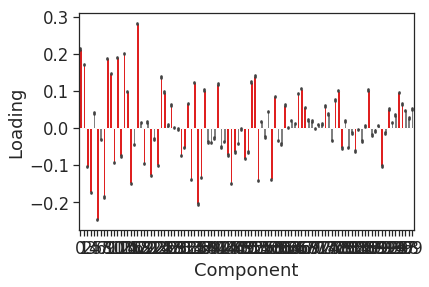

In [81]:
colors = ['Red' if x < 0.05 else 'Grey' for x in bsrx['p'].loc[2]]
sns.barplot(x='Component', y='Loading', data=plotr, palette=colors)

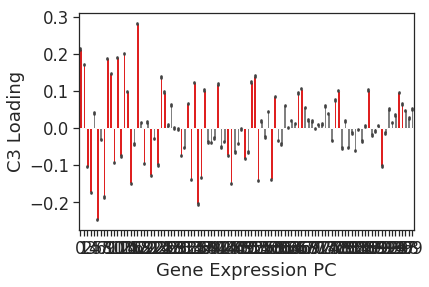

In [82]:
sns.set(font_scale=1.5)
sns.set_style('ticks')
colors = ['Red' if x else 'Grey' for x in multipletests(bsrx['p'].loc[2], method='fdr_bh')[0]]
sns.barplot(x='Component', y='Loading', data=plotr, palette=colors)
plt.xlabel('Gene Expression PC')
plt.ylabel('C3 Loading')
g.set_xticklabels([None for x in range(100)])
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C3_XWeights.pdf',
            bbox_inches='tight')

In [83]:
sigs = multipletests(bsrx['p'].loc[2], method='fdr_bh')[0]
new_loading = [pls_mod.x_loadings_[x,2] if sigs[x] else 0 for x in range(pca_tfm.shape[-1])]
newc3 = np.dot(pcamod.components_.T, new_loading)
newc3 = pandas.concat([pandas.Series(newc3), pandas.Series(bigdf.columns)],
                      axis=1)
for i,row in newc3.iterrows():
    if row['gene_symbol'] in probe_index.index:
        nm = probe_index.loc[row['gene_symbol'],'gene_name']
        if type(nm) == pandas.core.series.Series:
            newc3.loc[i,'gene_name'] = nm.values[0]
        elif pandas.notnull(nm):
            newc3.loc[i,'gene_name'] = nm

In [104]:
newc3.sort_values(0,ascending=False)

,0,gene_symbol,gene_name
4803,0.040281,G0S2,G0/G1switch 2
14647,0.039292,VSTM1,V-set and transmembrane domain containing 1
11116,0.036464,RILP,Rab interacting lysosomal protein
13323,0.035346,TEX26,testis expressed 26
9304,0.034005,P2RX6,"purinergic receptor P2X, ligand-gated ion chan..."
7005,0.033068,LINC01158,NaN
14657,0.032054,VWA3A,von Willebrand factor A domain containing 3A
10950,0.030705,RCAN2,regulator of calcineurin 2
379,0.030516,AIRE,autoimmune regulator
8650,0.030501,NEB,nebulin


In [84]:
newc3.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/GCorr_C3_genelist.csv')

In [85]:
allcomps.loc[:,'C3_Expression'] = newc3[newc3.columns[0]].values

In [86]:
c3_xp = hap.get_gene_vector(pandas.DataFrame(bigdf.T), newc3[0])

In [87]:
gdf.loc[:,'C3_Expression'] = c3_xp

In [88]:
input_coords = []
for i,row in gdf.iterrows():
    input_coords.append(hap.convert_coords([round(int(row['mni_nlin_x'])), 
                                        round(int(row['mni_nlin_y'])), 
                                        round(int(row['mni_nlin_z']))], 'xyz'))
nm = 'NEUR608_IMG_c3'
mni_pth = '/home/users/jvogel/Science/templates/templates/MNI152_T1_1mm_brain.nii'
wdir = '/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/'
gcx_img = hap.make_expression_image(c3_xp, input_coords, mni_pth, wdir, nm, 5, return_img=True)

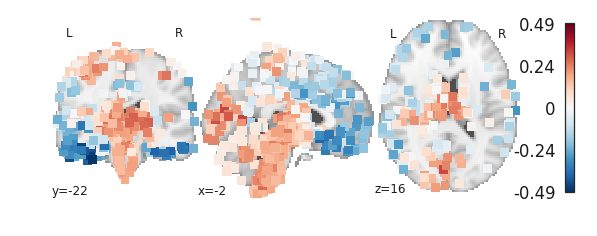

In [89]:
plotting.plot_stat_map(gcx_img,cut_coords=[-2,-22,16],
                       cmap='RdBu_r',
                       draw_cross=False)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C3_BrainGxp.pdf',
            bbox_inches='tight')

In [90]:
gcx_img.to_filename('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C3_XWeights.nii.gz')

### Prepare for GSEA

In [62]:
rank = pandas.DataFrame(index = probes.gene_symbol.unique(), columns = ['beta'])
for i,gene in enumerate(probes.gene_symbol.unique()):
    for col in probes.columns[-3:]:
        db = probes[probes.gene_symbol==gene][col]
        if type(db) == float:
            rank.loc[gene,col] = db
        else:
            #rank.loc[gene,'beta'] = db.mean() # take mean
            rank.loc[gene,col] = db.iloc[np.argmax(db.values)] # take highest rank
    if i%1000 == 0:
        print(i)

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000


In [65]:
rank.drop('beta',axis=1,inplace=True)

In [70]:
rank.sort_values('C2',ascending=False).head()

,C1,C2,C3
MET,0.028332,0.065229,-0.033451
TTR,0.001506,0.040164,0.062039
SOST,-0.001465,0.037713,0.012148
DMRT3,0.000724,0.035849,0.011679
CYP26B1,0.010748,0.035243,-0.009855


In [73]:
new_rank = pandas.DataFrame(index = range(len(rank)))
new_rank.loc[:,'Symbol'] = rank.index
for col in rank.columns:
    new_rank.loc[:,col] = rank[col].values

new_rank.head()

,Symbol,C1,C2,C3
0,C8G,0.000702,0.000065,-0.005231
1,C9,0.000390,0.000572,0.001446
2,MRPL49,0.001989,0.000026,-0.003131
3,ZNHIT2,0.003456,-0.000876,0.000026
4,MPPED2,0.002161,-0.000839,-0.001553


In [77]:
for col in rank.columns:
    new_rank.sort_values(col,ascending=False
                    )[['Symbol',col]].to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ADDX/LR_forGSEA_%s.rnk'%col,
                            sep = '\t', index=False)

# Separately for brainstem/cerebellum/cortex

running PCA
explained variance with PCA: 0.8374639392110836
transforming and splitting
fitting model to training data
evaluating output
finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400


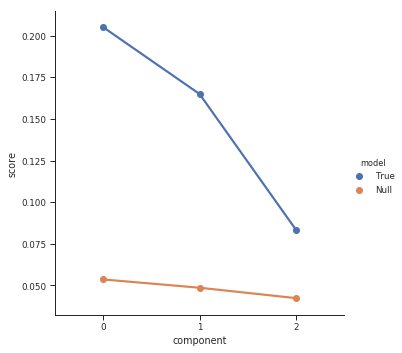

component 0: p = 0.002  ***
component 1: p = 0.002  ***
component 2: p = 0.002  ***
applying to test data


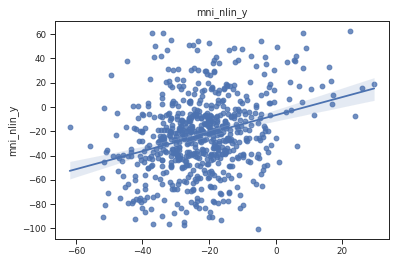

(0.3028372195280676, 8.768017012402718e-16)
23.298224465995965


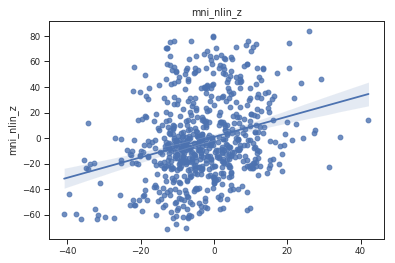

(0.2786526502784122, 1.6719488060107164e-13)
24.575748211224013


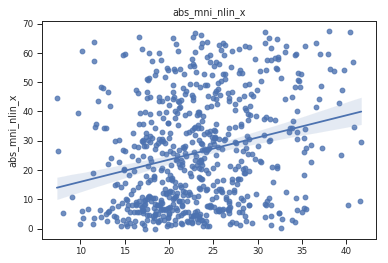

(0.25339994973018976, 2.3786899040333106e-11)
15.270640774688093


In [113]:
print('running PCA')
pcamod = PCA(n_components=100, random_state=123).fit(bigdf.values[gdf[gdf.slab_type=='CX'].index,:])
print('explained variance with PCA:',sum(pcamod.explained_variance_ratio_))
print('transforming and splitting')
pca_tfm = pandas.DataFrame(pcamod.transform(bigdf.values[gdf[gdf.slab_type=='CX'].index,:]))
tr,te = train_test_split(pca_tfm,random_state=123)
tr_y = gdf.loc[tr.index, ['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
te_y = gdf.loc[te.index, ['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
print('fitting model to training data')
pls_mod = PLSRegression(n_components=3)
# significant components?
print('evaluating output')
pls_mod.fit(tr,tr_y)
results, comp_sig = XD.evaluate_components(pls_mod, tr, tr_y)
# plot model fit
print('applying to test data')
pls_mod.fit(tr,tr_y)
te_pred = pls_mod.predict(te)
for i in range(te_y.shape[-1]):
    plt.close()
    sns.regplot(te_pred[:,i], te_y[te_y.columns[i]])
    plt.title(te_y.columns[i])
    plt.show()
    print(stats.pearsonr(te_pred[:,i], te_y[te_y.columns[i]]))
    print(mean_absolute_error(te_pred[:,i], te_y[te_y.columns[i]]))


running PCA
explained variance with PCA: 0.9445330684121362
transforming and splitting
fitting model to training data
evaluating output
finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400


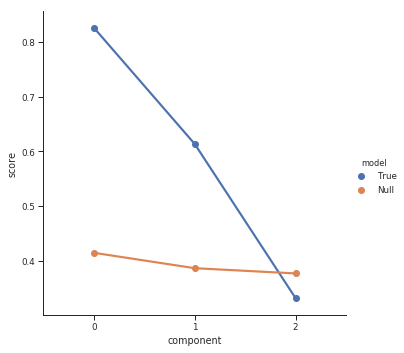

component 0: p = 0.002  ***
component 1: p = 0.002  ***
component 2: p = 0.834
applying to test data


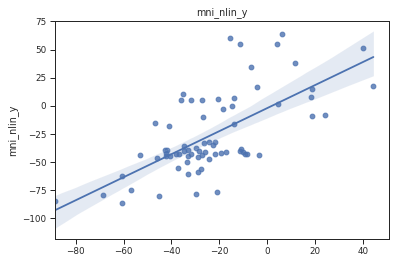

(0.6631987835252983, 2.1874693010883682e-10)
21.361476897263273


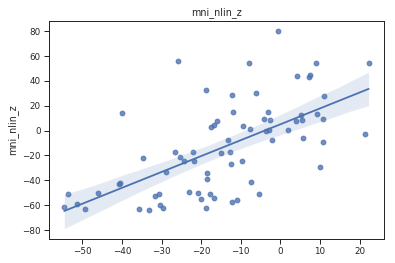

(0.6241689956589495, 4.681381186643695e-09)
22.128327981825617


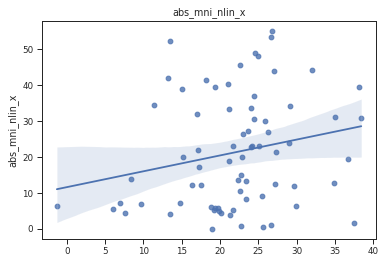

(0.2180636513683218, 0.06574460484569797)
12.581998867276816


In [114]:
print('running PCA')
pcamod = PCA(n_components=100, random_state=123).fit(bigdf.values[gdf[gdf.slab_type=='CB'].index,:])
print('explained variance with PCA:',sum(pcamod.explained_variance_ratio_))
print('transforming and splitting')
pca_tfm = pandas.DataFrame(pcamod.transform(bigdf.values[gdf[gdf.slab_type=='CB'].index,:]))
tr,te = train_test_split(pca_tfm,random_state=123)
tr_y = gdf.loc[tr.index, ['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
te_y = gdf.loc[te.index, ['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
print('fitting model to training data')
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(tr,tr_y)
# significant components?
print('evaluating output')
results, comp_sig = XD.evaluate_components(pls_mod, tr, tr_y)
# plot model fit
print('applying to test data')
pls_mod.fit(tr,tr_y)
te_pred = pls_mod.predict(te)
for i in range(te_y.shape[-1]):
    plt.close()
    sns.regplot(te_pred[:,i], te_y[te_y.columns[i]])
    plt.title(te_y.columns[i])
    plt.show()
    print(stats.pearsonr(te_pred[:,i], te_y[te_y.columns[i]]))
    print(mean_absolute_error(te_pred[:,i], te_y[te_y.columns[i]]))


running PCA
explained variance with PCA: 0.821231936645413
transforming and splitting
fitting model to training data
evaluating output
finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400


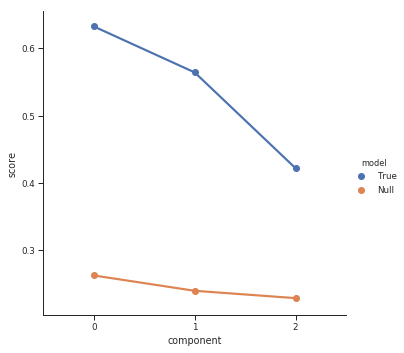

component 0: p = 0.002  ***
component 1: p = 0.002  ***
component 2: p = 0.002  ***
applying to test data


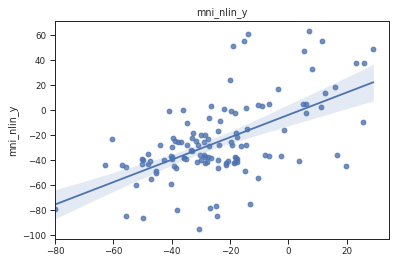

(0.5778511483739538, 3.9326025267145235e-12)
19.122360788864555


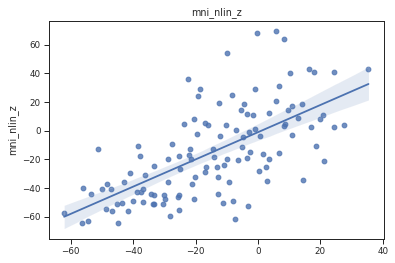

(0.6543529326997343, 3.9792770532242817e-16)
18.702405493032046


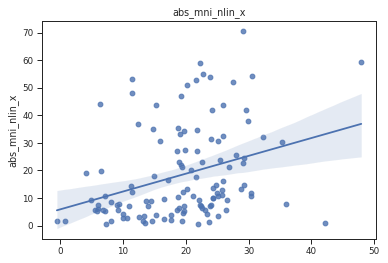

(0.32733943520921854, 0.00024747393916692924)
12.602596145417685


In [115]:
print('running PCA')
pcamod = PCA(n_components=100, random_state=123).fit(bigdf.values[gdf[gdf.slab_type=='BS'].index,:])
print('explained variance with PCA:',sum(pcamod.explained_variance_ratio_))
print('transforming and splitting')
pca_tfm = pandas.DataFrame(pcamod.transform(bigdf.values[gdf[gdf.slab_type=='BS'].index,:]))
tr,te = train_test_split(pca_tfm,random_state=123)
tr_y = gdf.loc[tr.index, ['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
te_y = gdf.loc[te.index, ['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
print('fitting model to training data')
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(tr,tr_y)
# significant components?
print('evaluating output')
results, comp_sig = XD.evaluate_components(pls_mod, tr, tr_y)
# plot model fit
print('applying to test data')
pls_mod.fit(tr,tr_y)
te_pred = pls_mod.predict(te)
for i in range(te_y.shape[-1]):
    plt.close()
    sns.regplot(te_pred[:,i], te_y[te_y.columns[i]])
    plt.title(te_y.columns[i])
    plt.show()
    print(stats.pearsonr(te_pred[:,i], te_y[te_y.columns[i]]))
    print(mean_absolute_error(te_pred[:,i], te_y[te_y.columns[i]]))


#### now again with PCA from whole brain

In [117]:
pcamod = PCA(n_components=100, random_state=123).fit(bigdf)
sum(pcamod.explained_variance_ratio_)

0.846047690073279

transforming and splitting
fitting model to training data
evaluating output
finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400


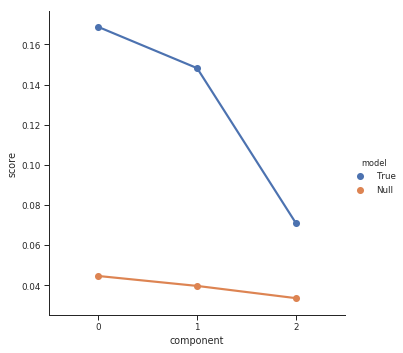

component 0: p = 0.002  ***
component 1: p = 0.002  ***
component 2: p = 0.002  ***
applying to test data


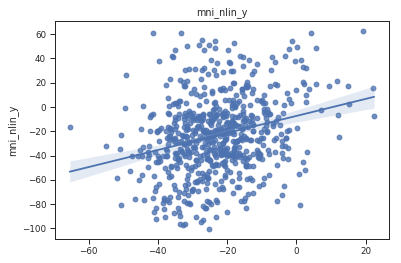

(0.2692246620166155, 1.1317809247041177e-12)
23.70978974550569


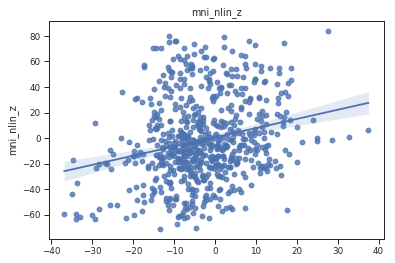

(0.23298174426703885, 8.993163301375036e-10)
24.59035313463408


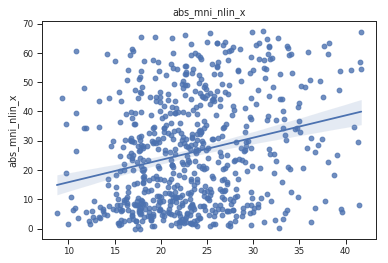

(0.25391898763952403, 2.159527435221041e-11)
15.392817590925201


In [118]:
print('transforming and splitting')
pca_tfm = pandas.DataFrame(pcamod.transform(bigdf.values[gdf[gdf.slab_type=='CX'].index,:]))
tr,te = train_test_split(pca_tfm,random_state=123)
tr_y = gdf.loc[tr.index, ['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
te_y = gdf.loc[te.index, ['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
print('fitting model to training data')
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(tr,tr_y)
# significant components?
print('evaluating output')
results, comp_sig = XD.evaluate_components(pls_mod, tr, tr_y)
pls_mod.fit(tr,tr_y)
# plot model fit
print('applying to test data')
te_pred = pls_mod.predict(te)
for i in range(te_y.shape[-1]):
    plt.close()
    sns.regplot(te_pred[:,i], te_y[te_y.columns[i]])
    plt.title(te_y.columns[i])
    plt.show()
    print(stats.pearsonr(te_pred[:,i], te_y[te_y.columns[i]]))
    print(mean_absolute_error(te_pred[:,i], te_y[te_y.columns[i]]))


transforming and splitting
fitting model to training data
evaluating output
finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400


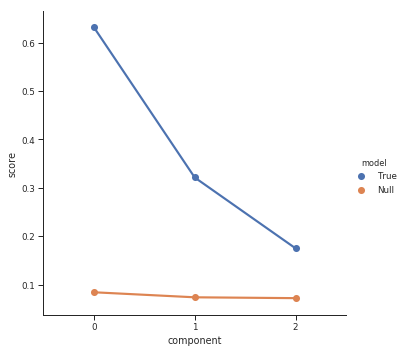

component 0: p = 0.002  ***
component 1: p = 0.002  ***
component 2: p = 0.002  ***
applying to test data


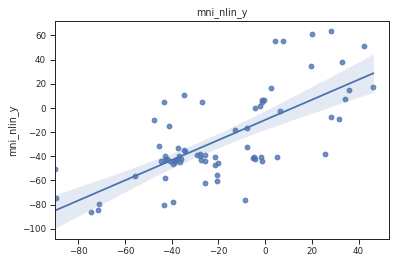

(0.7010173530828849, 7.054855252239744e-12)
20.962194458369396


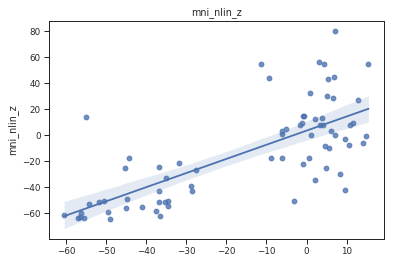

(0.7223894251851728, 7.916990356282946e-13)
18.66950528895868


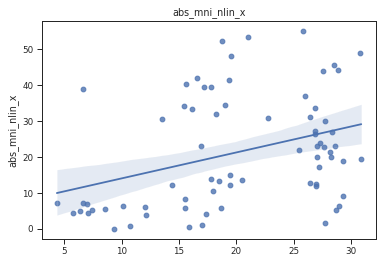

(0.3569353291700177, 0.0020856739823818704)
11.603377848137631


In [119]:
print('transforming and splitting')
pca_tfm = pandas.DataFrame(pcamod.transform(bigdf.values[gdf[gdf.slab_type=='CB'].index,:]))
tr,te = train_test_split(pca_tfm,random_state=123)
tr_y = gdf.loc[tr.index, ['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
te_y = gdf.loc[te.index, ['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
print('fitting model to training data')
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(tr,tr_y)
# significant components?
print('evaluating output')
results, comp_sig = XD.evaluate_components(pls_mod, tr, tr_y)
pls_mod.fit(tr,tr_y)
# plot model fit
print('applying to test data')
te_pred = pls_mod.predict(te)
for i in range(te_y.shape[-1]):
    plt.close()
    sns.regplot(te_pred[:,i], te_y[te_y.columns[i]])
    plt.title(te_y.columns[i])
    plt.show()
    print(stats.pearsonr(te_pred[:,i], te_y[te_y.columns[i]]))
    print(mean_absolute_error(te_pred[:,i], te_y[te_y.columns[i]]))


transforming and splitting
fitting model to training data
evaluating output
finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400


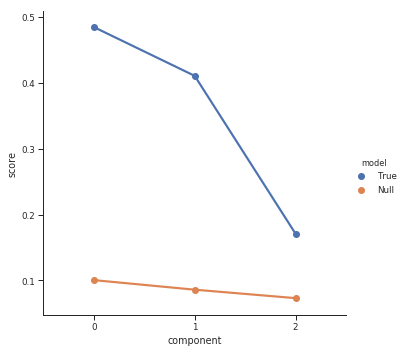

component 0: p = 0.002  ***
component 1: p = 0.002  ***
component 2: p = 0.002  ***
applying to test data


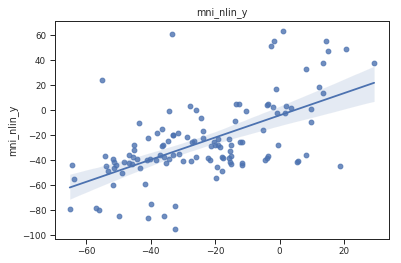

(0.5937175777686451, 7.113030048150821e-13)
18.946013034589622


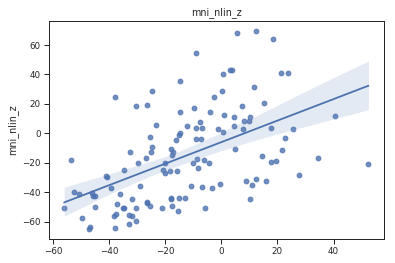

(0.5175504225463767, 1.2116844846592604e-09)
22.196921988489937


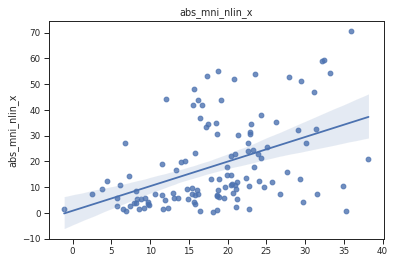

(0.4557271108382748, 1.500151582844603e-07)
11.769002398959628


In [120]:
print('transforming and splitting')
pca_tfm = pandas.DataFrame(pcamod.transform(bigdf.values[gdf[gdf.slab_type=='BS'].index,:]))
tr,te = train_test_split(pca_tfm,random_state=123)
tr_y = gdf.loc[tr.index, ['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
te_y = gdf.loc[te.index, ['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
print('fitting model to training data')
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(tr,tr_y)
# significant components?
print('evaluating output')
results, comp_sig = XD.evaluate_components(pls_mod, tr, tr_y)
pls_mod.fit(tr,tr_y)
# plot model fit
print('applying to test data')
te_pred = pls_mod.predict(te)
for i in range(te_y.shape[-1]):
    plt.close()
    sns.regplot(te_pred[:,i], te_y[te_y.columns[i]])
    plt.title(te_y.columns[i])
    plt.show()
    print(stats.pearsonr(te_pred[:,i], te_y[te_y.columns[i]]))
    print(mean_absolute_error(te_pred[:,i], te_y[te_y.columns[i]]))


# Understanding the components

In [107]:
Medulla = ['arcuate nucleus of medulla, left','arcuate nucleus of medulla, right',
                 'central glial substance',
                 'central medullary reticular group, left','central medullary reticular group, right',
                 'cochlear nuclei, left','cochlear nuclei, right',
                 'cuneate nucleus, left','cuneate nucleus, right',
                 'dorsal motor nucleus of the vagus, left','dorsal motor nucleus of the vagus, right',
                 'gigantocellular group, left','gigantocellular group, right',
                 'gracile nucleus, left','gracile nucleus, right',
                 'hypoglossal nucleus, left','hypoglossal nucleus, right',
                 'inferior olivary complex, left','inferior olivary complex, right',
                 'lateral medullary reticular group, left','lateral medullary reticular group, right',
                 'raphe nuclei of medulla',
                 'spinal trigeminal nucleus, left','spinal trigeminal nucleus, right',
                 'superior olivary complex, left','superior olivary complex, right',
                 'vestibular nuclei, left','vestibular nuclei, right']

Pons =          ['abducens nucleus, left','abducens nucleus, right',
                 'central gray of the pons, left','central gray of the pons, right',
                 'facial motor nucleus, left','facial motor nucleus, right',
                 'lateral parabrachial nucleus, left','lateral parabrachial nucleus, right',
                 'locus ceruleus, left','locus ceruleus, right',
                 'medial parabrachial nucleus, left','medial parabrachial nucleus, right',
                 'medial parabrachial nucleus,right',
                 'motor nucleus of trigeminal nerve, left','motor nucleus of trigeminal nerve, right',
                 'nucleus subceruleus, left','nucleus subceruleus, right',
                 'pontine nuclei, left','pontine nuclei, right',
                 'pontine raphe nucleus','pontine raphe nucleus, left',
                 'pontine reticular formation, left','pontine reticular formation, right',
                 'principal sensory nucleus of trigeminal nerve, left','principal sensory nucleus of trigeminal nerve, right',
                 ]

DCN = ['dentate nucleus, left',
       'dentate nucleus, right',
       'emboliform nucleus, left',
       'emboliform nucleus, right',
       'fastigial nucleus, left',
       'fastigial nucleus, right',
       'globose nucleus, left',
       'globose nucleus, right']

Cerebellum = [x for x in gdf[gdf.slab_type=='CB']['structure_name'].unique().tolist() if x not in DCN]

Tectum = ['inferior colliculus, left',
          'superior colliculus, left','superior colliculus, right',
          'pretectal region']

Tegmentum = ['central gray substance of midbrain, left','central gray substance of midbrain, right',
            'cuneiform nucleus, left','cuneiform nucleus, right',
            'Edinger-Westphal nucleus, left','Edinger-Westphal nucleus, right',
            'interstitial nucleus of Cajal, left','interstitial nucleus of Cajal, right',
            'midbrain raphe nuclei','midbrain raphe nuclei, left',
            'midbrain reticular formation, left','midbrain reticular formation, right',
            'nucleus of Darkschewitsch, left',
            'oculomotor nuclear complex, right','oculomotor nuclear complex, left',
            'red nucleus, left','red nucleus, right',
            'subcuneiform nucleus, left','subcuneiform nucleus, right',
            'substantia nigra, pars compacta, left','substantia nigra, pars compacta, right',
            'substantia nigra, pars reticulata, left','substantia nigra, pars reticulata, right',
            'trochlear nucleus, left','trochlear nucleus, right',
            'ventral tegmental area, left','ventral tegmental area, right']

Hypothalamus = ['anterior hypothalamic area, left','anterior hypothalamic area, right',
               'arcuate nucleus of the hypothalamus, left','arcuate nucleus of the hypothalamus, right',
               'dorsomedial hypothalamic nucleus, left',
               'lateral hypothalamic area, anterior region, left', 'lateral hypothalamic area, anterior region, right',
               'lateral hypothalamic area, mammillary region, left', 'lateral hypothalamic area, mammillary region, right',
               'lateral hypothalamic area, tuberal region, left',
               'paraventricular nucleus of the hypothalamus, left','paraventricular nucleus of the hypothalamus, right',
               'perifornical nucleus, left',
               'posterior hypothalamic area, left','posterior hypothalamic area, right',
               'preoptic region, left','preoptic region, right',
               'supraoptic nucleus, left','supraoptic nucleus, right',
               'ventromedial hypothalamic nucleus, left','ventromedial hypothalamic nucleus, right',]
                

Thalamus = ['anterior group of nuclei, left','anterior group of nuclei, right',
           'caudal group of intralaminar nuclei, left','caudal group of intralaminar nuclei, right',
           'dorsal lateral geniculate nucleus, left','dorsal lateral geniculate nucleus, right',
           'lateral group of nuclei, left, dorsal division','lateral group of nuclei, left, ventral division',
           'lateral group of nuclei, right, dorsal division','lateral group of nuclei, right, ventral division',
           'medial geniculate complex, left','medial geniculate complex, right',
           'medial group of nuclei, left','medial group of nuclei, right',
           'reticular nucleus of thalamus, left','reticular nucleus of thalamus, right',
           'rostral group of intralaminar nuclei, left','rostral group of intralaminar nuclei, right',
           'paraventricular nuclei, left of thalamus, left','paraventricular nuclei, right of thalamus, right',
           'posterior group of nuclei, left','posterior group of nuclei, right',
           'subthalamic nucleus, left','subthalamic nucleus, right',
           'zona incerta, left','zona incerta, right']

Other_Dien = ['lateral habenular nucleus, left','lateral habenular nucleus, right',
             'lateral mammillary nucleus, left',
             'lateral tuberal nucleus, left',
             'mammillary body, left','mammillary body, right',
             'medial habenular nucleus, left','medial habenular nucleus, right',
             'medial mammillary nucleus, left',
             'pallidohypothalamic nucleus, left',
             'pineal gland',
             'supramammillary nucleus, left',
             'tuberomammillary nucleus, left']

Limbic = ['CA1 field, left','CA1 field, right',
          'CA2 field, left','CA2 field, right',
          'CA3 field, left','CA3 field, right',
          'CA4 field, left','CA4 field, right',
          'amygdalohippocampal transition zone, left',
          'amygdalohippocampal transition zone, right',
          'basolateral nucleus, left','basolateral nucleus, right',
          'basomedial nucleus, left','basomedial nucleus, right',
          'central nucleus, left','central nucleus, right',
          'cortico-medial group, left','cortico-medial group, right',
          'dentate gyrus, left','dentate gyrus, right',
          'lateral nucleus, left','lateral nucleus, right',
          'septal nuclei, left','septal nuclei, right',
         'subiculum, left','subiculum, right']

Forebrain = ['basal nucleus of meynert, left','basal nucleus of meynert, right',
            'nucleus accumbens, left','nucleus accumbens, right',
            'nucleus of the diagonal band, left, horizontal division',
            'nucleus of the diagonal band, left, vertical division',
            'olfactory tubercle, left', 'piriform cortex, left',
            'substantia innominata, left','substantia innominata, right']

Striatum = ['bed  nucleus of stria terminalis, left',
            'body of caudate nucleus, left',
            'body of caudate nucleus, right',
            'globus pallidus, external segment, left','globus pallidus, external segment, right',
            'globus pallidus, internal segment, left','globus pallidus, internal segment, right',
            'head of caudate nucleus, left','head of caudate nucleus, right',
            'olfactory tubercle, left',
            'putamen, left','putamen, right',
           'tail of caudate nucleus, left','tail of caudate nucleus, right']

Anterior_Cingulate = ['cingulate gyrus, frontal part, left, inferior bank of gyrus',
                     'cingulate gyrus, frontal part, left, superior bank of gyrus',
                     'cingulate gyrus, frontal part, right, inferior bank of gyrus',
                     'cingulate gyrus, frontal part, right, superior bank of gyrus',
                     'paraterminal gyrus, right',
                     'parolfactory gyri, left','parolfactory gyri, right',
                     'subcallosal cingulate gyrus, left','subcallosal cingulate gyrus, right']

Posterior_Cingulate = ['cingulate gyrus, parietal part, left, inferior bank of gyrus',
                     'cingulate gyrus, parietal part, left, superior bank of gyrus',
                     'cingulate gyrus, parietal part, right, inferior bank of gyrus',
                     'cingulate gyrus, parietal part, right, superior bank of gyrus',
                     'cingulate gyrus, retrosplenial part, left, inferior bank of gyrus',
                     'cingulate gyrus, retrosplenial part, left, superior bank of gyrus',
                     'cingulate gyrus, retrosplenial part, right, inferior bank of gyrus',
                     'cingulate gyrus, retrosplenial part, right, superior bank of gyrus',]

Insula = ['claustrum, left','claustrum, right',
         'long insular gyri, left','long insular gyri, right',
         'short insular gyri, left','short insular gyri, right',]

Temporal = ["Heschl's gyrus, left", "Heschl's gyrus, right",
           'fusiform gyrus, left, bank of cos','fusiform gyrus, left, bank of the its',
           'fusiform gyrus, left, lateral bank of gyrus','fusiform gyrus, right, bank of cos',
           'fusiform gyrus, right, bank of the its','fusiform gyrus, right, lateral bank of gyrus',
           'inferior temporal gyrus, left, bank of mts','inferior temporal gyrus, left, bank of the its',
           'inferior temporal gyrus, left, lateral bank of gyrus','inferior temporal gyrus, right, bank of mts',
           'inferior temporal gyrus, right, bank of the its','inferior temporal gyrus, right, lateral bank of gyrus',
           'middle temporal gyrus, left, inferior bank of gyrus','middle temporal gyrus, left, superior bank of gyrus',
           'middle temporal gyrus, right, inferior bank of gyrus','middle temporal gyrus, right, superior bank of gyrus',
           'occipito-temporal gyrus, left, inferior bank of gyrus','occipito-temporal gyrus, left, superior bank of gyrus',
           'occipito-temporal gyrus, right, inferior bank of gyrus','occipito-temporal gyrus, right, superior bank of gyrus',
           'parahippocampal gyrus, left, bank of the cos','parahippocampal gyrus, left, lateral bank of gyrus',
           'parahippocampal gyrus, right, bank of the cos','parahippocampal gyrus, right, lateral bank of gyrus',
           'superior temporal gyrus, left, inferior bank of gyrus','superior temporal gyrus, left, lateral bank of gyrus',
           'superior temporal gyrus, right, inferior bank of gyrus','superior temporal gyrus, right, lateral bank of gyrus',
           'temporal pole, left, inferior aspect','temporal pole, left, medial aspect',
           'temporal pole, left, superior aspect','temporal pole, right, inferior aspect',
           'temporal pole, right, medial aspect','temporal pole, right, superior aspect',
           'transverse gyri, left','transverse gyri, right',
           'planum polare, left','planum polare, right',
           'planum temporale, left','planum temporale, right']

Parietal = ['angular gyrus, left, inferior bank of gyrus','angular gyrus, left, superior bank of gyrus',
            'angular gyrus, right, inferior bank of gyrus','angular gyrus, right, superior bank of gyrus',
            'precuneus, left, inferior lateral bank of gyrus','precuneus, left, superior lateral bank of gyrus',
            'precuneus, right, inferior lateral bank of gyrus','precuneus, right, superior lateral bank of gyrus',
            'superior parietal lobule, left, inferior bank of gyrus','superior parietal lobule, left, superior bank of gyrus',
            'superior parietal lobule, right, inferior bank of gyrus','superior parietal lobule, right, superior bank of gyrus',
            'supramarginal gyrus, left, inferior bank of gyrus','supramarginal gyrus, left, superior bank of gyrus',
            'supramarginal gyrus, right, inferior bank of gyrus','supramarginal gyrus, right, superior bank of gyrus']

Frontal = ['anterior orbital gyrus, left','anterior orbital gyrus, right',
           'arcuate nucleus of the hypothalamus, left','arcuate nucleus of the hypothalamus, right',
          'frontal operculum, left','frontal operculum, right',
          'frontal pole, left, inferior aspect','frontal pole, left, medial aspect',
          'frontal pole, left, superior aspect','frontal pole, right, inferior aspect',
          'frontal pole, right, medial aspect','frontal pole, right, superior aspect',
          'gyrus rectus, left','gyrus rectus, right',
          'inferior frontal gyrus, opercular part, left','inferior frontal gyrus, opercular part, right',
          'inferior frontal gyrus, orbital part, left','inferior frontal gyrus, orbital part, right',
          'inferior frontal gyrus, triangular part, left','inferior frontal gyrus, triangular part, right',
          'inferior rostral gyrus, left','inferior rostral gyrus, right',
          'lateral orbital gyrus, left','lateral orbital gyrus, right',
          'medial orbital gyrus, left','medial orbital gyrus, right',
          'middle frontal gyrus, left, inferior bank of gyrus','middle frontal gyrus, left, superior bank of gyrus',
          'middle frontal gyrus, right, inferior bank of gyrus','middle frontal gyrus, right, superior bank of gyrus',
          'posterior orbital gyrus, left','posterior orbital gyrus, right',
          'superior frontal gyrus, left','superior frontal gyrus, left, lateral bank of gyrus',
          'superior frontal gyrus, left, medial bank of gyrus','superior frontal gyrus, right, lateral bank of gyrus',
          'superior frontal gyrus, right, medial bank of gyrus',
          'superior rostral gyrus, left','superior rostral gyrus, right']

Occipital = ['cuneus, left, peristriate',
             'cuneus, left, striate',
             'cuneus, right, peristriate',
             'cuneus, right, striate',
             'inferior occipital gyrus, left, inferior bank of gyrus','inferior occipital gyrus, left, superior bank of gyrus',
             'inferior occipital gyrus, right, inferior bank of gyrus','inferior occipital gyrus, right, superior bank of gyrus',
             'lingual gyrus, left, peristriate','lingual gyrus, left, striate',
             'lingual gyrus, right, peristriate','lingual gyrus, right, striate',
             'occipital pole, left, inferior aspect',
             'occipital pole, left, lateral aspect','occipital pole, left, superior aspect',
             'superior occipital gyrus, left, inferior bank of gyrus','superior occipital gyrus, left, superior bank of gyrus',
             'superior occipital gyrus, right, inferior bank of gyrus','superior occipital gyrus, right, superior bank of gyrus',]

Sensorimotor = ['paracentral lobule, anterior part, left','paracentral lobule, anterior part, left, inferior bank of gyrus',
                'paracentral lobule, anterior part, left, superior bank of gyrus','paracentral lobule, anterior part, right, inferior bank of gyrus',
                'paracentral lobule, anterior part, right, superior bank of gyrus','paracentral lobule, posterior part, left, bank of cingulate sulcus',
                'paracentral lobule, posterior part, left, lateral bank of gyrus','paracentral lobule, posterior part, right, bank of cingulate sulcus',
                'paracentral lobule, posterior part, right, lateral bank of gyrus',
                'postcentral gyrus, left, bank of the central sulcus','postcentral gyrus, left, bank of the posterior central sulcus',
                'postcentral gyrus, left, inferior lateral aspect of gyrus','postcentral gyrus, left, superior lateral aspect of gyrus',
                'postcentral gyrus, right, bank of the central sulcus','postcentral gyrus, right, bank of the posterior central sulcus',
                'postcentral gyrus, right, inferior lateral aspect of gyrus','postcentral gyrus, right, superior lateral aspect of gyrus',
                'precentral gyrus, left, bank of the central sulcus','precentral gyrus, left, bank of the precentral sulcus',
                'precentral gyrus, left, inferior lateral aspect of gyrus','precentral gyrus, left, superior lateral aspect of gyrus',
                'precentral gyrus, right, bank of the central sulcus','precentral gyrus, right, bank of the precentral sulcus',
                'precentral gyrus, right, inferior lateral aspect of gyrus','precentral gyrus, right, superior lateral aspect of gyrus']
            
divs = [Medulla, Pons, DCN, Cerebellum, Tectum, Tegmentum, Hypothalamus, Thalamus, Other_Dien,
                  Limbic, Forebrain, Striatum, Anterior_Cingulate, Posterior_Cingulate, Insula,
                  Temporal, Frontal, Parietal, Occipital, Sensorimotor]
names = ['Medulla', 'Pons', 'DCN', 'Cerebellum', 'Tectum', 'Tegmentum', 'Hypothalamus', 'Thalamus', 
         'Other_Dien', 'Limbic', 'Forebrain', 'Striatum', 'Anterior_Cingulate', 'Posterior_Cingulate', 
         'Insula', 'Temporal', 'Frontal', 'Parietal', 'Occipital', 'Sensorimotor']
brain_division = dict(zip(names,divs))

for name, div in brain_division.items():
    gdf.loc[gdf[gdf.structure_name.isin(div)].index,'brain_divison'] = name
    

In [108]:
# For C1
Meyelencephalon = Medulla[:] 
Metencelphalon = Pons + DCN + Cerebellum
Mesencephalon = Tectum + Tegmentum
Diencephalon = Hypothalamus + Thalamus + Other_Dien
Telencephalon = Limbic + Forebrain + Striatum + Anterior_Cingulate + Posterior_Cingulate +\
                Insula + Temporal + Frontal + Parietal + Occipital + Sensorimotor

divs = [Meyelencephalon, Metencelphalon, Mesencephalon, Diencephalon, Telencephalon]
names = ['Meyelencephalon', 'Metencelphalon', 'Mesencephalon', 'Diencephalon', 'Telencephalon']
brain_division = dict(zip(names,divs))

for name, div in brain_division.items():
    gdf.loc[gdf[gdf.structure_name.isin(div)].index,'Neural_Tube_segment'] = name
    

In [112]:
# For C3

Auditory = ["Heschl's gyrus, left", "Heschl's gyrus, right",
            'planum polare, left','planum polare, right',
            'planum temporale, left','planum temporale, right',
            'transverse gyri, left','transverse gyri, right']
Visual = ['cuneus, left, peristriate','cuneus, left, striate',
                 'cuneus, right, peristriate','cuneus, right, striate',
                 'lingual gyrus, left, peristriate','lingual gyrus, left, striate',
                 'lingual gyrus, right, peristriate','lingual gyrus, right, striate']
Olfactory = ['olfactory tubercle, left', 'piriform cortex, left']


Sensory_Cortex = Sensorimotor + Auditory + Visual + Olfactory
gdf.loc[gdf[gdf.structure_name.isin(Sensory_Cortex)].index,'Cortical_Type'] = 'Sensory'

Association_Cortex = [x for x in Telencephalon if x not in Striatum and x not in Sensory_Cortex]
gdf.loc[gdf[gdf.structure_name.isin(Association_Cortex)].index,'Cortical_Type'] = 'Association_Cortex'

Cerebellar_Cortex = [x for x in Cerebellum]
gdf.loc[gdf[gdf.structure_name.isin(Cerebellar_Cortex)].index,'Cortical_Type'] = 'Cerebellar_Cortex'

Not_Cortex = Meyelencephalon + Mesencephalon + Pons + DCN + Diencephalon + Striatum
gdf.loc[gdf[gdf.structure_name.isin(Not_Cortex)].index,'Cortical_Type'] = 'Not Cortex'


divs = [Auditory, Visual, Olfactory, Sensorimotor, Association_Cortex, Not_Cortex, Cerebellar_Cortex]
names = ['Auditory','Visual','Olfactory','Sensorimotor','Association_Cortex','Not_Cortex','Cerebellar_Cortex']
brain_division = dict(zip(names,divs))
for name, div in brain_division.items():
    gdf.loc[gdf[gdf.structure_name.isin(div)].index,'Sensory_Type'] = name


In [110]:
# for c2
alar_medulla = ['spinal trigeminal nucleus, right', 'spinal trigeminal nucleus, left',
               'cochlear nuclei, left','cochlear nuclei, right',
               'vestibular nuclei, left','vestibular nuclei, right',
               'inferior olivary complex, left','inferior olivary complex, right',
                'gracile nucleus, left','gracile nucleus, right',
               'cuneate nucleus, left','cuneate nucleus, right',
               'superior olivary complex, left','superior olivary complex, right',]

basal_medulla = ['hypoglossal nucleus, left','hypoglossal nucleus, right',
                'lateral medullary reticular group, left','lateral medullary reticular group, right',
                'dorsal motor nucleus of the vagus, left','dorsal motor nucleus of the vagus, right', 
                'arcuate nucleus of medulla, left','arcuate nucleus of medulla, right',
                'central medullary reticular group, left','central medullary reticular group, right',
                'raphe nuclei of medulla',
                'gigantocellular group, left','gigantocellular group, right', ]


divs = [alar_medulla, basal_medulla]
names = ['Alar_Medulla','Basal_Medulla']
med_division = dict(zip(names,divs))

for name, div in med_division.items():
    gdf.loc[gdf[gdf.structure_name.isin(div)].index,'brain_divison'] = name

dorsal_plate = ['Cerebellum', 'Thalamus', 'Tectum', 'Alar_Medulla']
ventral_plate = ['Hypothalamus','Pons','Tegmentum','Basal_Medulla']
subcortical = ['Forebrain', 'Striatum', 'Limbic']
frontal = ['Anterior_Cingulate','Insula','Frintal']
temporal = ['Temporal']
somatomotor = ['Sensorimotor']
parietal = ['Parietal']
occipital = ['Occipital']

gdf.loc[gdf[gdf.brain_divison.isin(dorsal_plate)].index,'Neural_Plate'] = 'Dorsal'
gdf.loc[gdf[gdf.brain_divison.isin(ventral_plate)].index,'Neural_Plate'] = 'Ventral'
gdf.loc[gdf[gdf.brain_divison.isin(subcortical)].index,'Neural_Plate'] = 'Subcortical'
gdf.loc[gdf[gdf.brain_divison.isin(frontal)].index,'Neural_Plate'] = 'Frontal'
gdf.loc[gdf[gdf.brain_divison.isin(temporal)].index,'Neural_Plate'] = 'Temporal'
gdf.loc[gdf[gdf.brain_divison.isin(somatomotor)].index,'Neural_Plate'] = 'Somatomotor'
gdf.loc[gdf[gdf.brain_divison.isin(parietal)].index,'Neural_Plate'] = 'Parietal'
gdf.loc[gdf[gdf.brain_divison.isin(occipital)].index,'Neural_Plate'] = 'Occipital'


In [302]:
#gdf.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/MAIN_gcx_wholebrain_info_W_BRAIN_DIVISIONS.csv')

In [95]:
code = dict(zip(gdf.Neural_Tube_segment.unique().tolist(),
               range(len(gdf.Neural_Tube_segment.unique().tolist()))))
labs = [code[x] if pandas.notnull(x) else 999 for x in gdf.Neural_Tube_segment.values]
embedding = gdf[['abs_mni_nlin_x','mni_nlin_y','mni_nlin_z']].values

lmap = {v: k for k, v in code.items()}
lmap.pop(5)
lmap.update({999: 'NaN'})
traces = list()
for lab in np.unique(labs):
    l_index = [x for x in range(len(labs)) if labs[x] == lab]
    l_embed = embedding[l_index]
#     color_str = str(int('0x' + color_dict[lab][1:3].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][3:5].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][5:7].upper(),16))
    #color_str = plt.cm.tab10.colors[lab]
    color_str = 'rgba %s'%str(tuple([x - 0.0000001 for x in plt.cm.tab10(lab) if x > 0]))
    temp_trace = plotly.graph_objs.Scatter3d(x=l_embed[:,0],
                                            y = l_embed[:,1],
                                            z = l_embed[:,2],
                                            name = lmap[lab],
                                            mode = 'markers',
                                            marker = dict(size=3,
                                                          color=color_str
                                                         )
                                            )
    traces.append(temp_trace)

layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=traces, layout=layout)
plotly.offline.plot(fig, 
                    filename='/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/NT_brain.html')
    

'/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/NT_brain.html'

In [96]:
code = dict(zip(gdf.Neural_Tube_segment.unique().tolist(),
               range(len(gdf.Neural_Tube_segment.unique().tolist()))))
labs = [code[x] if pandas.notnull(x) else 999 for x in gdf.Neural_Tube_segment.values]
embedding = preds_df[['predicted_x','predicted_y','predicted_z']].values

lmap = {v: k for k, v in code.items()}
lmap.pop(5)
lmap.update({999: 'NaN'})
traces = list()
for lab in np.unique(labs):
    l_index = [x for x in range(len(labs)) if labs[x] == lab]
    l_embed = embedding[l_index]
#     color_str = str(int('0x' + color_dict[lab][1:3].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][3:5].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][5:7].upper(),16))
    #color_str = plt.cm.tab10.colors[lab]
    color_str = 'rgba %s'%str(tuple([x - 0.0000001 for x in plt.cm.tab10(lab) if x > 0]))
    temp_trace = plotly.graph_objs.Scatter3d(x=l_embed[:,0],
                                            y = l_embed[:,1],
                                            z = l_embed[:,2],
                                            name = lmap[lab],
                                            mode = 'markers',
                                            marker = dict(size=3,
                                                          color=color_str
                                                         )
                                            )
    traces.append(temp_trace)

layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=traces, layout=layout)
plotly.offline.plot(fig, 
                    filename='/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/PCorr_NT_brain_predicted.html')
    

'/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/PCorr_NT_brain_predicted.html'

In [97]:
code = dict(zip(gdf.brain_divison.unique().tolist(),
               range(len(gdf.brain_divison.unique().tolist()))))
labs = [code[x] if pandas.notnull(x) else 999 for x in gdf.brain_divison.values]
embedding = gdf[['abs_mni_nlin_x','mni_nlin_y','mni_nlin_z']].values

lmap = {v: k for k, v in code.items()}
lmap.pop(19)
lmap.update({999: 'NaN'})
traces = list()
for lab in np.unique(labs):
    l_index = [x for x in range(len(labs)) if labs[x] == lab]
    l_embed = embedding[l_index]
#     color_str = str(int('0x' + color_dict[lab][1:3].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][3:5].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][5:7].upper(),16))
    #color_str = plt.cm.tab10.colors[lab]
    color_str = 'rgba %s'%str(tuple([x - 0.0000001 for x in plt.cm.tab20(lab) if x > 0]))
    temp_trace = plotly.graph_objs.Scatter3d(x=l_embed[:,0],
                                            y = l_embed[:,1],
                                            z = l_embed[:,2],
                                            name = lmap[lab],
                                            mode = 'markers',
                                            marker = dict(size=3,
                                                          color=color_str
                                                         )
                                            )
    traces.append(temp_trace)

layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=traces, layout=layout)
plotly.offline.plot(fig, 
                    filename='/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/ADDX/brain.html')
    

KeyError: 19

In [347]:
code = dict(zip(gdf.brain_divison.unique().tolist(),
               range(len(gdf.brain_divison.unique().tolist()))))
labs = [code[x] if pandas.notnull(x) else 999 for x in gdf.brain_divison.values]
embedding = preds_df[['predicted_x','predicted_y','predicted_z']].values

lmap = {v: k for k, v in code.items()}
lmap.pop(19)
lmap.update({999: 'NaN'})
traces = list()
for lab in np.unique(labs):
    l_index = [x for x in range(len(labs)) if labs[x] == lab]
    l_embed = embedding[l_index]
#     color_str = str(int('0x' + color_dict[lab][1:3].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][3:5].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][5:7].upper(),16))
    #color_str = plt.cm.tab10.colors[lab]
    color_str = 'rgba %s'%str(tuple([x - 0.0000001 for x in plt.cm.tab20(lab) if x > 0]))
    temp_trace = plotly.graph_objs.Scatter3d(x=l_embed[:,0],
                                            y = l_embed[:,1],
                                            z = l_embed[:,2],
                                            name = lmap[lab],
                                            mode = 'markers',
                                            marker = dict(size=3,
                                                          color=color_str
                                                         )
                                            )
    traces.append(temp_trace)

layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=traces, layout=layout)
plotly.offline.plot(fig, 
                    filename='/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ADDX/brain_predicted.html')
    

/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/subprocess.py:761: ResourceWarning:

subprocess 19487 is still running



'file:///home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ADDX/brain_predicted.html'

In [98]:
gdf.loc[:,'Component1_Expresion'] = c1_xp
gdf.loc[:,'Component2_Expresion'] = c2_xp
gdf.loc[:,'Component3_Expresion'] = c3_xp


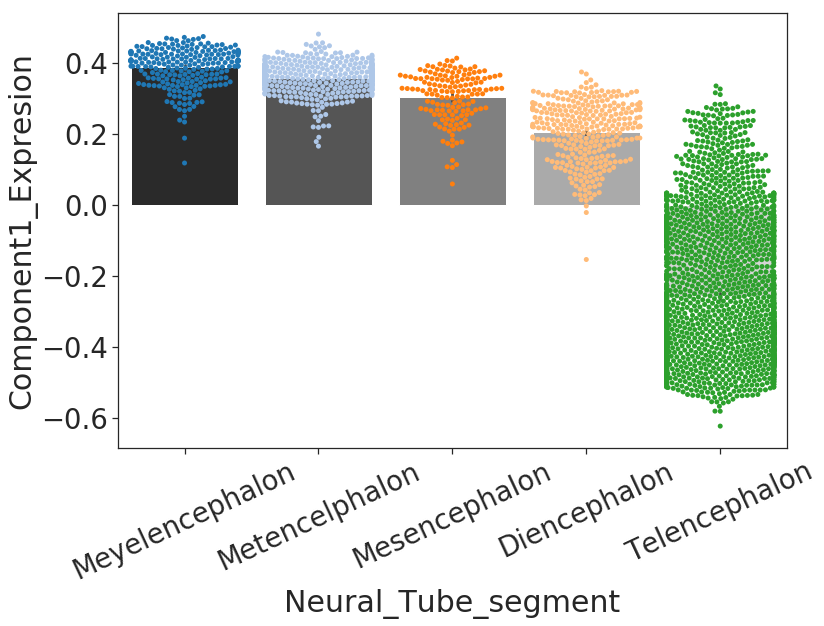

In [100]:
sns.set_context('notebook',font_scale=2.5)
plt.subplots(figsize=(12,8))
order = ['Meyelencephalon', 'Metencelphalon', 'Mesencephalon', 
         'Diencephalon', 'Telencephalon']
sns.barplot(x='Neural_Tube_segment', y='Component1_Expresion', 
            data=gdf,palette='gray',
           order = order)
g=sns.swarmplot(x='Neural_Tube_segment', y='Component1_Expresion', 
              data=gdf, 
              #hue='brain_divison',
              order = order, palette='tab20')
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
g.set_xticklabels(order,rotation=25)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C1_NT.pdf',
           bbox_inches='tight')

In [101]:
rbpal = [sns.color_palette('RdBu')[0],
                      sns.color_palette('RdBu')[-1]]

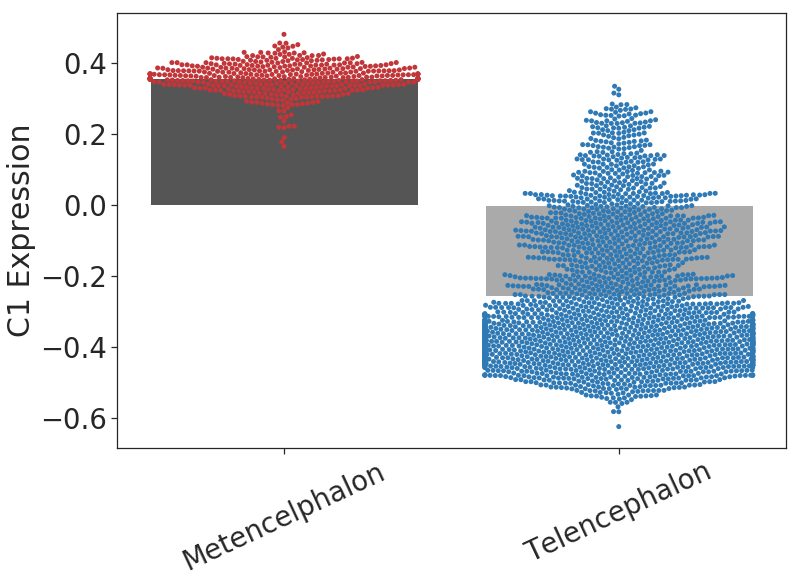

In [102]:
# Just cortex and cerebellum
sns.set_context('notebook',font_scale=2.5)
plt.subplots(figsize=(12,8))
order = ['Metencelphalon','Telencephalon']
sns.barplot(x='Neural_Tube_segment', y='Component1_Expresion', 
            data=gdf[gdf.Neural_Tube_segment.isin(order)],
            palette='gray',
           order = order
           )
g=sns.swarmplot(x='Neural_Tube_segment', y='Component1_Expresion', 
              data=gdf[gdf.Neural_Tube_segment.isin(order)], 
              #hue='brain_divison',
              order = order, palette=rbpal)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
g.set_xticklabels(order,rotation=25)
plt.ylabel('C1 Expression')
plt.xlabel('')
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/BSComp_ABA_C1.pdf',
           bbox_inches='tight')

In [103]:
bsn = []
for x in gdf.structure_name.values:
    if ',' in x:
        bsn.append(x.split(',')[0])
    else:
        bsn.append(x)
gdf.loc[:,'bilateral_structure_name'] = bsn

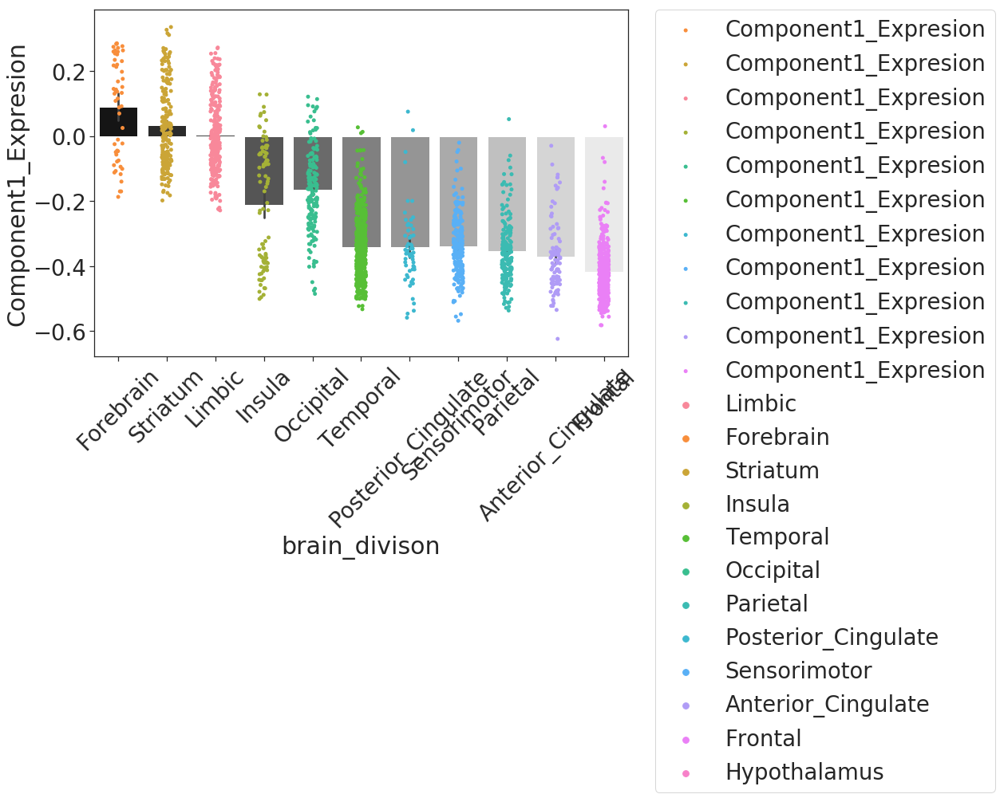

In [104]:
plt.subplots(figsize=(12,8))
order = ['Forebrain', 'Striatum', 'Limbic', 'Insula', 'Occipital',
        'Temporal','Posterior_Cingulate','Sensorimotor','Parietal',
        'Anterior_Cingulate','Frontal']
g=sns.barplot(x='brain_divison', y='Component1_Expresion', order = order,
            data=gdf[gdf.Neural_Tube_segment=='Telencephalon'], palette='gray',
           )
h=sns.stripplot(x='brain_divison', y='Component1_Expresion', order=order,jitter=True,
              hue='brain_divison',
            data=gdf[gdf.Neural_Tube_segment=='Telencephalon'],
           )
for item in h.get_xticklabels():
    item.set_rotation(45)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C1_Tele.pdf',
           bbox_inches='tight')

In [105]:
gdf.Sensory_Type.value_counts()

Association_Cortex    1729
Not_Cortex            1089
Cerebellar_Cortex      256
Sensorimotor           215
Visual                 107
Auditory                60
Olfactory                8
Name: Sensory_Type, dtype: int64

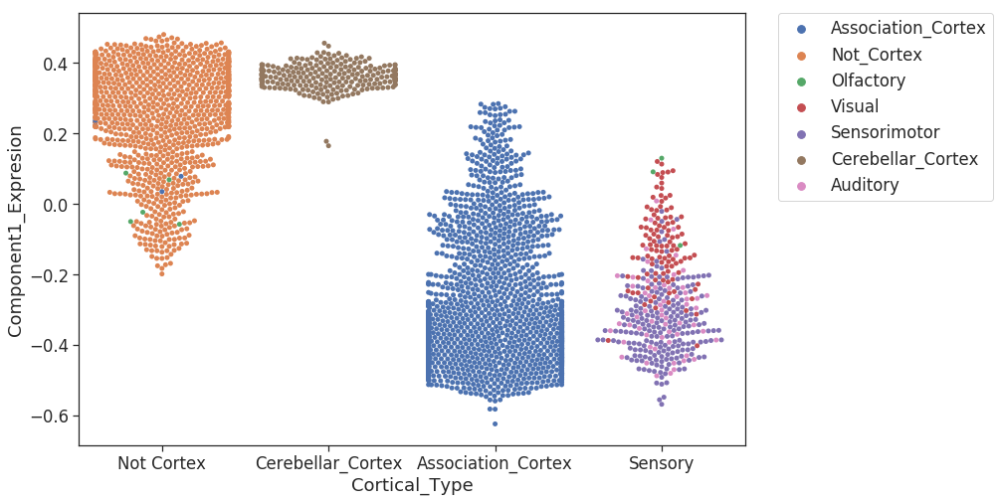

In [114]:
sns.set_context('notebook',font_scale=1.5)
plt.subplots(figsize=(12,8))
order = ['Not Cortex','Cerebellar_Cortex','Association_Cortex','Sensory']
sns.swarmplot(x='Cortical_Type', y='Component1_Expresion', data=gdf, hue='Sensory_Type', order=order)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C1_Modals.pdf',
           bbox_inches='tight')

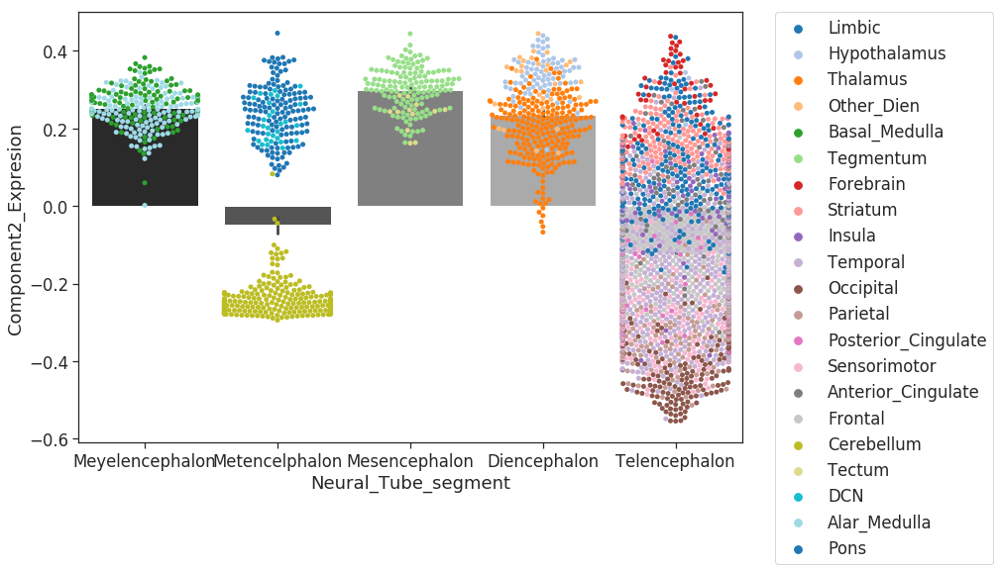

In [115]:
sns.set_context('notebook',font_scale=1.5)
plt.subplots(figsize=(12,8))
order = ['Meyelencephalon', 'Metencelphalon', 'Mesencephalon', 'Diencephalon', 'Telencephalon']
sns.barplot(x='Neural_Tube_segment', y='Component2_Expresion', data=gdf,palette='gray',
           order = order)
sns.swarmplot(x='Neural_Tube_segment', y='Component2_Expresion', data=gdf, hue='brain_divison',
              order = order, palette='tab20')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_NT.pdf',
           bbox_inches='tight')

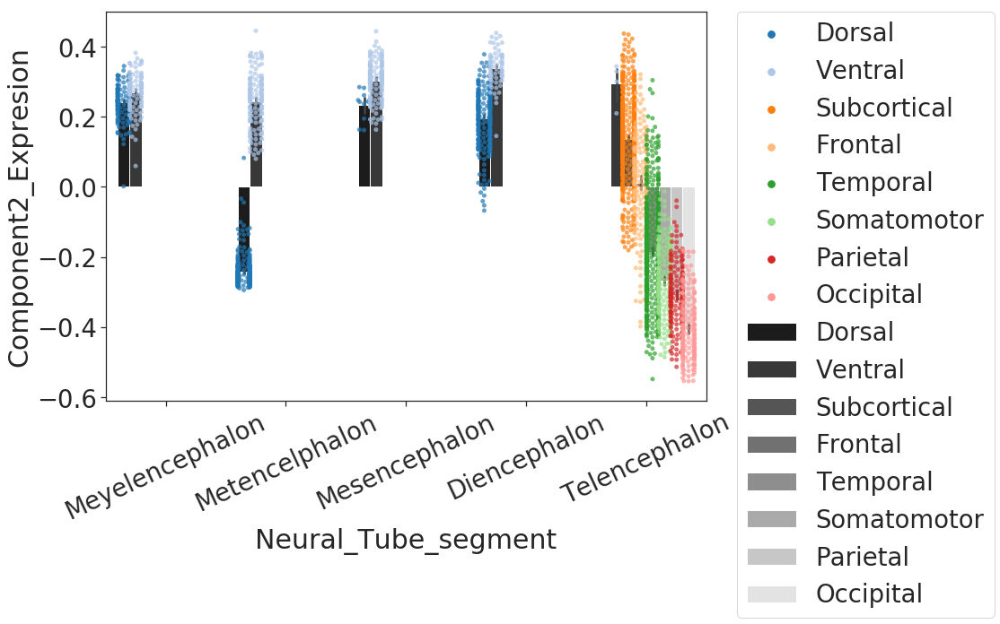

In [116]:
sns.set_context('notebook',font_scale=2.5)
plt.subplots(figsize=(12,8))
order = ['Meyelencephalon', 'Metencelphalon', 'Mesencephalon', 
         'Diencephalon','Telencephalon']
horder = ['Dorsal','Ventral','Subcortical','Frontal','Temporal',
         'Somatomotor','Parietal','Occipital']
sns.barplot(x='Neural_Tube_segment', y='Component2_Expresion', 
            data=gdf,palette='gray',hue='Neural_Plate',
           order = order,hue_order=horder)
g=sns.swarmplot(x='Neural_Tube_segment', y='Component2_Expresion', 
              data=gdf, hue='Neural_Plate',dodge=True,
              order = order, palette='tab20',hue_order=horder,
               alpha=0.7)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
g.set_xticklabels(order,rotation=25)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_NT.pdf',
           bbox_inches='tight')

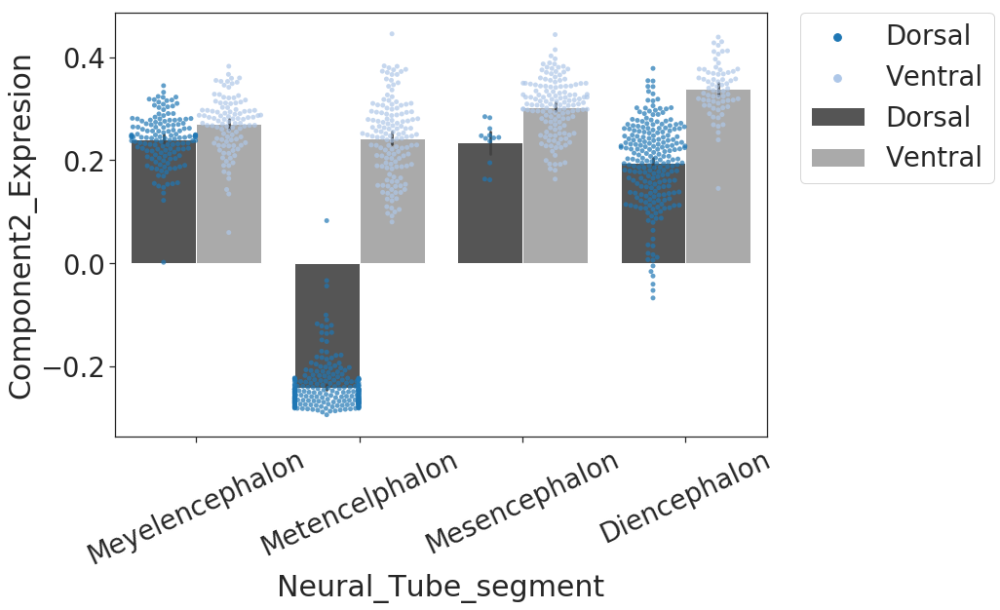

In [117]:
sns.set_context('notebook',font_scale=2.5)
plt.subplots(figsize=(12,8))
order = ['Meyelencephalon', 'Metencelphalon', 'Mesencephalon', 
         'Diencephalon']
horder = ['Dorsal','Ventral']
sns.barplot(x='Neural_Tube_segment', y='Component2_Expresion', 
            data=gdf[gdf.Neural_Tube_segment!='Telencephalon'],
            palette='gray',hue='Neural_Plate',
           order = order,hue_order=horder)
g=sns.swarmplot(x='Neural_Tube_segment', y='Component2_Expresion', 
              data=gdf[gdf.Neural_Tube_segment!='Telencephalon'],
                hue='Neural_Plate',dodge=True,
              order = order, palette='tab20',hue_order=horder,
               alpha=0.7)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
g.set_xticklabels(order,rotation=25)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_NT-NoTele.pdf',
           bbox_inches='tight')

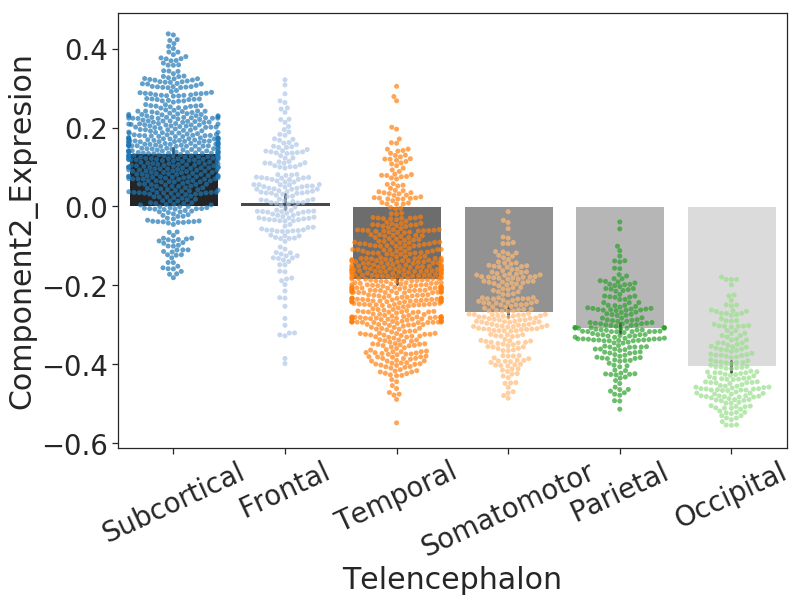

In [118]:
sns.set_context('notebook',font_scale=2.5)
plt.subplots(figsize=(12,8))
order = ['Subcortical', 'Frontal', 'Temporal','Somatomotor', 
         'Parietal','Occipital']
#horder = ['Dorsal','Ventral']
sns.barplot(x='Neural_Plate', y='Component2_Expresion', 
            data=gdf[gdf.Neural_Tube_segment=='Telencephalon'],
            palette='gray',#hue='Neural_Plate',
           order = order,
            hue_order=order
           )
g=sns.swarmplot(x='Neural_Plate', y='Component2_Expresion', 
              data=gdf[gdf.Neural_Tube_segment=='Telencephalon'],
                #hue='Neural_Plate',dodge=True,
              order = order, 
                #hue_order=order,
                palette='tab20',alpha=0.7)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
g.set_xticklabels(order,rotation=25)
plt.xlabel('Telencephalon')
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_NT-TeleOnly.pdf',
           bbox_inches='tight')

In [119]:
for i in range(1,4):
    c_vals = pandas.pivot_table(gdf,values='Component%s_Expresion'%i,
                                 index='brain_divison',aggfunc=np.mean
                                )
    for div in c_vals.index:
        sem = gdf[gdf.brain_divison==div]['Component%s_Expresion'%i
                                         ].sem()
        c_vals.loc[div,'sem'] = sem
    c_vals.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/GCorr_BSComp_ABA_C%s_data.csv'%i)
    c_vals.head()

In [120]:
c2_vals = pandas.pivot_table(gdf,values='Component2_Expresion',
                             index='brain_divison',aggfunc=np.mean
                            )
for div in c2_vals.index:
    sem = gdf[gdf.brain_divison==div]['Component2_Expresion'].sem()
    c2_vals.loc[div,'sem'] = sem
c2_vals.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/GCorr_BSComp_ABA_C2_data.csv')
c2_vals.head()

,Component2_Expresion,sem
brain_divison,,
Alar_Medulla,0.240741,0.004108
Anterior_Cingulate,0.035712,0.013029
Basal_Medulla,0.270035,0.005305
Cerebellum,-0.241571,0.002791
DCN,0.215401,0.009181


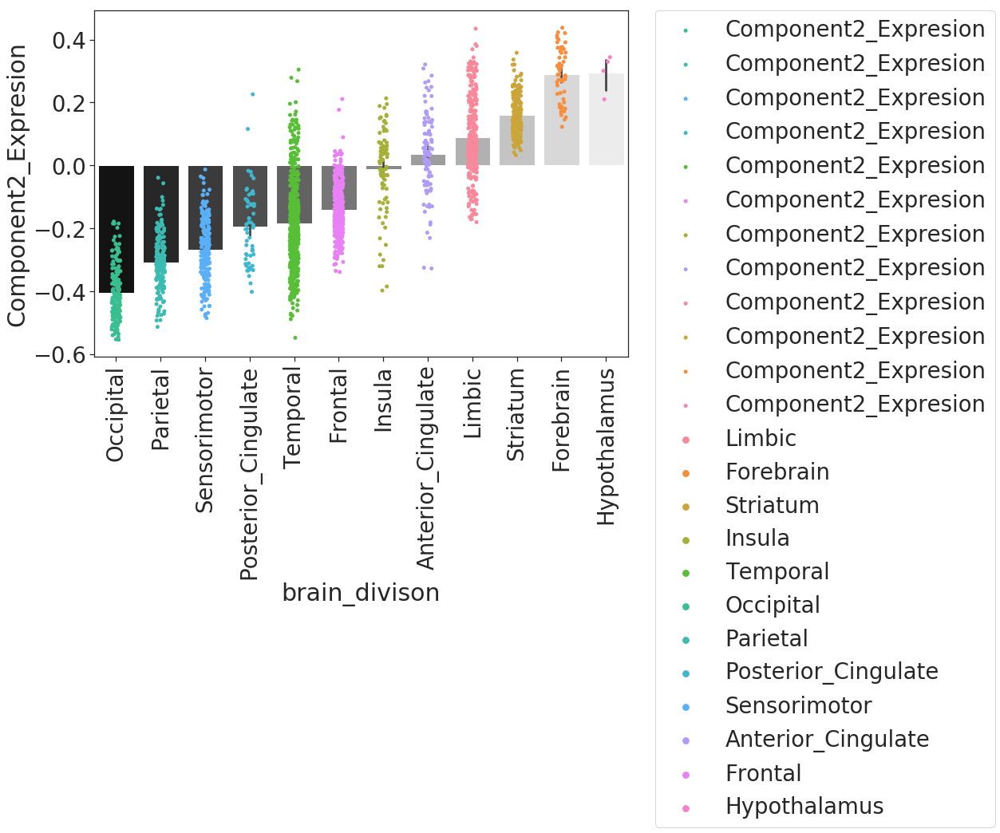

In [121]:
order = gdf[gdf.Neural_Tube_segment=='Telencephalon'
           ].pivot_table(values='Component2_Expresion',index = 'brain_divison'
                       ).sort_values('Component2_Expresion').index

plt.subplots(figsize=(12,8))
g=sns.barplot(x='brain_divison', y='Component2_Expresion', order = order,
            data=gdf[gdf.Neural_Tube_segment=='Telencephalon'], palette='gray',
           )
h=sns.stripplot(x='brain_divison', y='Component2_Expresion', order=order,jitter=True,
              hue='brain_divison',
            data=gdf[gdf.Neural_Tube_segment=='Telencephalon'],
           )
for item in h.get_xticklabels():
    item.set_rotation(90)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_Tele.pdf',
           bbox_inches='tight')

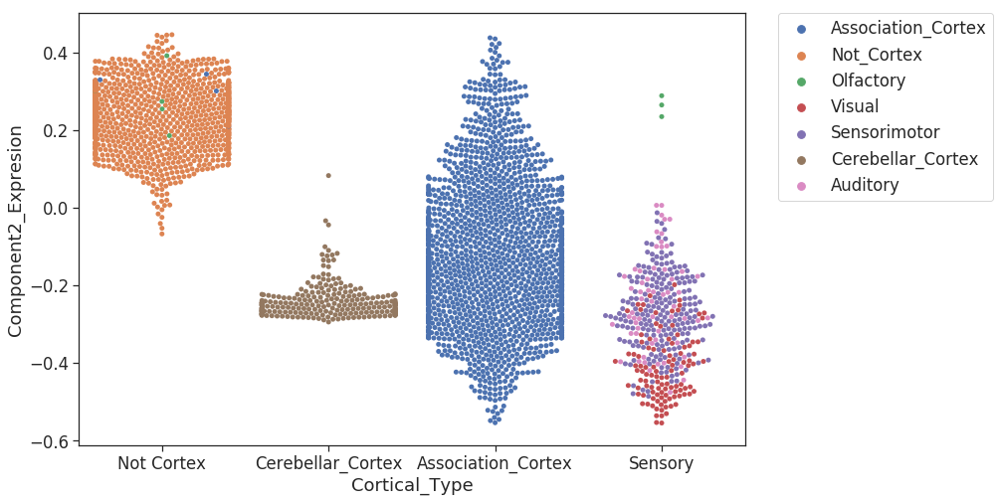

In [124]:
sns.set_context('notebook',font_scale=1.5)
plt.subplots(figsize=(12,8))
order = ['Not Cortex','Cerebellar_Cortex','Association_Cortex','Sensory']
sns.swarmplot(x='Cortical_Type', y='Component2_Expresion', data=gdf, hue='Sensory_Type', order=order)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_Modals.pdf',
           bbox_inches='tight')

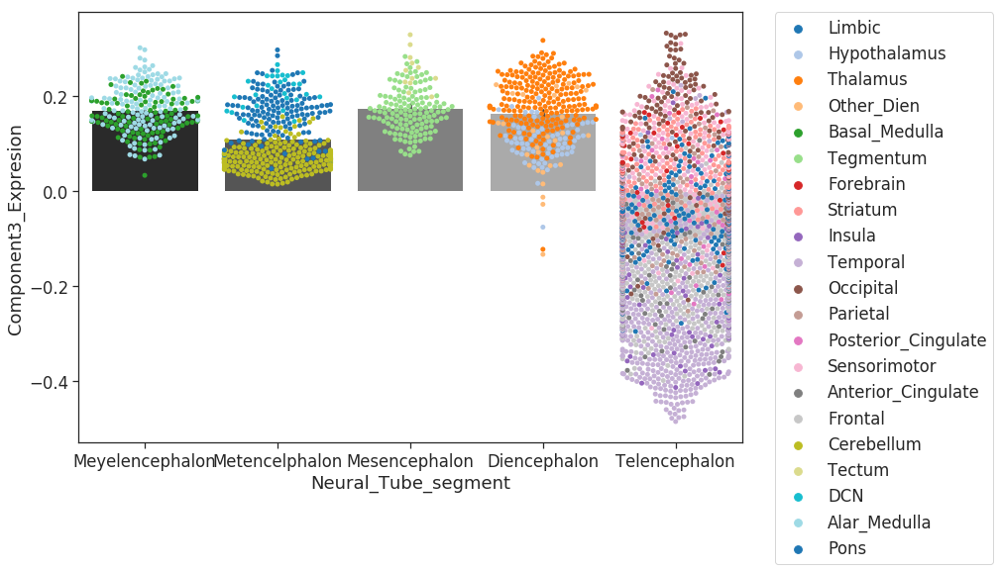

In [125]:
sns.set_context('notebook',font_scale=1.5)
plt.subplots(figsize=(12,8))
order = ['Meyelencephalon', 'Metencelphalon', 'Mesencephalon', 'Diencephalon', 'Telencephalon']
sns.barplot(x='Neural_Tube_segment', y='Component3_Expresion', data=gdf,palette='gray',
           order = order)
sns.swarmplot(x='Neural_Tube_segment', y='Component3_Expresion', data=gdf, hue='brain_divison',
              order = order, palette='tab20')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C3_NT.pdf',
           bbox_inches='tight')

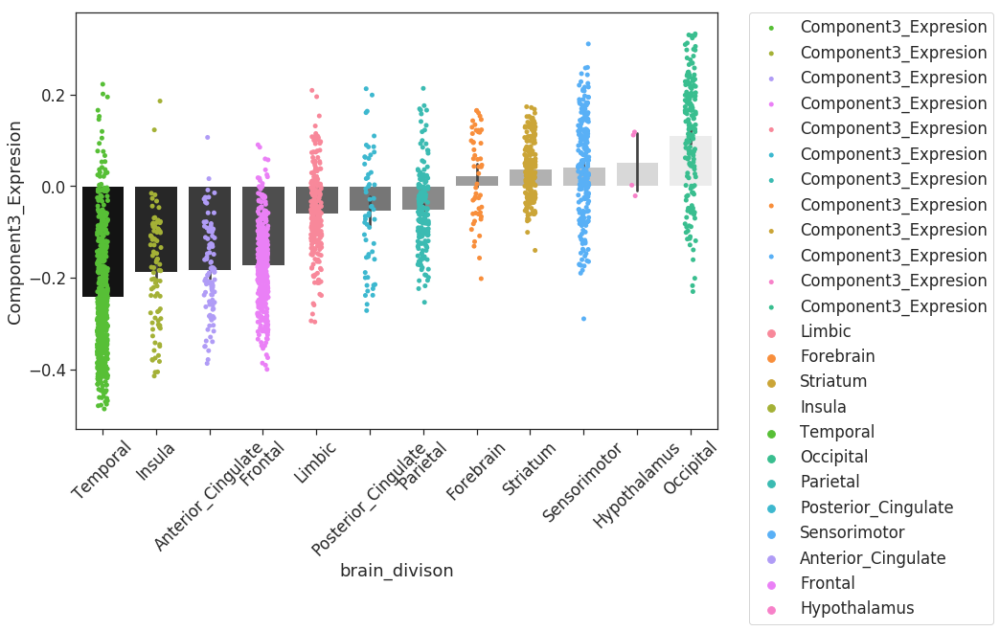

In [126]:
order = gdf[gdf.Neural_Tube_segment=='Telencephalon'
           ].pivot_table(values='Component3_Expresion',index = 'brain_divison'
                       ).sort_values('Component3_Expresion').index

plt.subplots(figsize=(12,8))
g=sns.barplot(x='brain_divison', y='Component3_Expresion', order = order,
            data=gdf[gdf.Neural_Tube_segment=='Telencephalon'], palette='gray',
           )
h=sns.stripplot(x='brain_divison', y='Component3_Expresion', order=order,jitter=True,
              hue='brain_divison',
            data=gdf[gdf.Neural_Tube_segment=='Telencephalon'],
           )
for item in h.get_xticklabels():
    item.set_rotation(45)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C3_Tele.pdf',
           bbox_inches='tight')

In [260]:
gdf.columns[-10:]

Index(['new_structure_acronym', 'abs_mni_nlin_x', 'brain_divison',
       'Neural_Tube_segment', 'Sensory_Type', 'Cortical_Type',
       'Component1_Expresion', 'Component2_Expresion', 'Component3_Expresion',
       'bilateral_structure_name'],
      dtype='object')

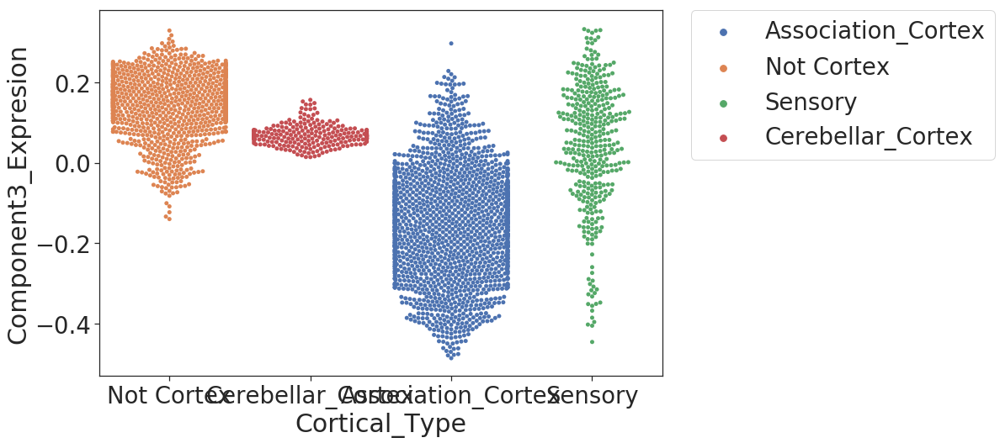

In [128]:
sns.set_context('notebook',font_scale=2.5)
plt.subplots(figsize=(12,8))
order = ['Not Cortex','Cerebellar_Cortex','Association_Cortex','Sensory']
sns.swarmplot(x='Cortical_Type', y='Component3_Expresion', 
              data=gdf, hue='Cortical_Type',order=order,
             )
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C3_Modals.pdf',
           bbox_inches='tight')

In [355]:
for col in gdf.columns[-4:-1]:
    

Index(['Component1_Expresion', 'Component2_Expresion', 'Component3_Expresion'], dtype='object')

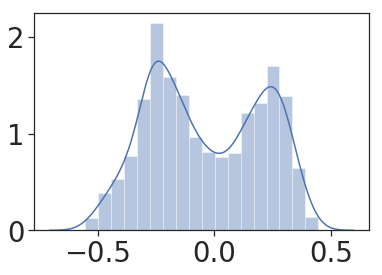

In [129]:
sns.distplot(c2_xp)

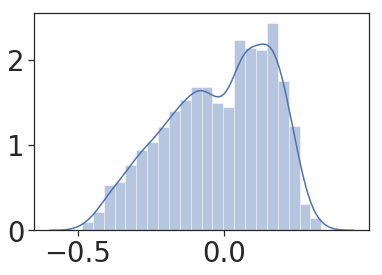

In [130]:
sns.distplot(c3_xp)

# Projection

In [131]:
pcamod = PCA(n_components=100, random_state=123).fit(bigdf)
sum(pcamod.explained_variance_ratio_)
pca_tfm = pandas.DataFrame(pcamod.transform(bigdf))
pls_mod = PLSRegression(n_components=3)
#full_y = gdf[['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
pls_mod.fit(pca_tfm, full_y)

PLSRegression(copy=True, max_iter=500, n_components=3, scale=True, tol=1e-06)

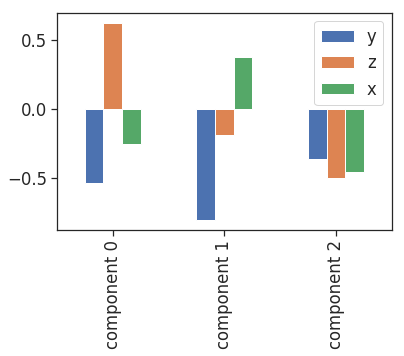

In [132]:
sns.set_context('notebook',font_scale=1.5)
pandas.DataFrame(pls_mod.y_weights_, 
                 index=['component %s'%x for x in range(3)],
                 columns=['y','z','x']).plot.bar()

In [149]:
pls_mod.y_weights_[0]

array([-0.53740344,  0.62235325, -0.25007202])

In [150]:
pls_mod.y_weights_[0,:]

array([-0.53740344,  0.62235325, -0.25007202])

In [133]:
input_coords = []
for i,row in gdf.iterrows():
    input_coords.append(hap.convert_coords([round(int(row['mni_nlin_x'])), 
                                        round(int(row['mni_nlin_y'])), 
                                        round(int(row['mni_nlin_z']))], 'xyz'))
nm = 'NEUR608_IMG_c2'
mni_pth = '/home/users/jvogel/Science/templates/templates/MNI152_T1_1mm_brain.nii'
wdir = '/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/'
gcx_img = hap.make_expression_image(c2_xp, input_coords, mni_pth, wdir, nm, 5, return_img=True)

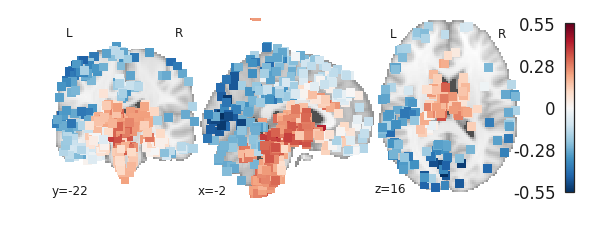

In [134]:
plotting.plot_stat_map(gcx_img,cut_coords=[-2,-22,16],
                       cmap='RdBu_r',
                       draw_cross=False)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_BrainGxp.pdf',
#             bbox_inches='tight')

In [ ]:
#gcx_img.to_filename('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/C2_XWeights.nii.gz')

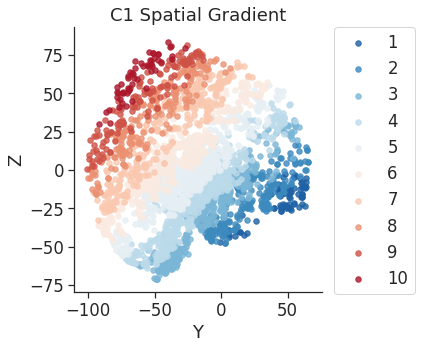

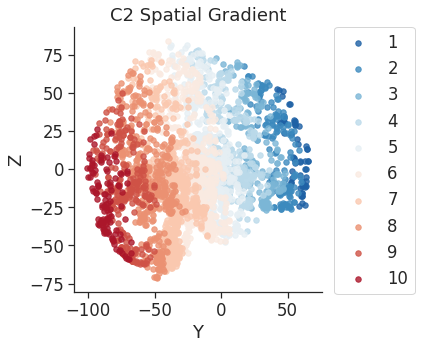

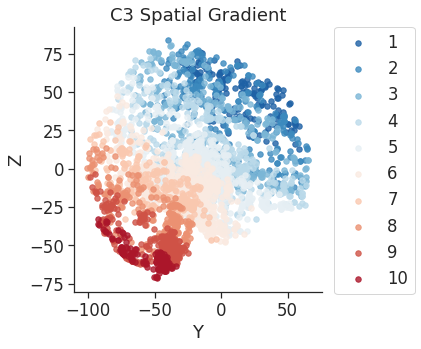

In [135]:
from sklearn.preprocessing import MinMaxScaler

for i in range(pls_mod.y_weights_.shape[0]):
    sg = np.dot(full_y.values,pls_mod.y_weights_[i,:])
    gdf.loc[:,'C%s_SmoothGradient'%(i+1)] = sg
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    cut = pandas.cut(scaled_sg,10)
    code = dict(zip(np.unique(cut),range(1,len(np.unique(cut))+1)))
    gdf.loc[:,'C%s_SpatialGradient'%(i+1)] = [code[x] for x in cut]

    sns.lmplot('mni_nlin_y', 'mni_nlin_z', 
               hue = 'C%s_SpatialGradient'%(i+1),legend=False, 
               data=gdf, fit_reg=False, 
               scatter_kws={"s": 30},
              palette='RdBu_r')
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('C%s Spatial Gradient'%(i+1))
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C%s_BrainSpatialWB.pdf'%(i+1),
          bbox_inches='tight')
    plt.show()
    
#     gcx_img = hap.make_expression_image(#gdf['C%s_SpatialGradient'%(i+1)
#                                         #   ].values - 5.1,
#                                         sg,
#                                         input_coords, mni_pth, wdir, 
#                                         nm, 5, return_img=True)
#     plotting.plot_stat_map(gcx_img,cut_coords=[-2,-22,16],
#                        cmap='RdBu_r',
#                        draw_cross=False)
    
#     plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/C%s_BrainSpatial.pdf'%(i+1),
#                bbox_inches='tight')
#     plt.show()
#     gcx_img.to_filename('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/C%s_YWeights.nii.gz'%(i+1))

(-81, 95)

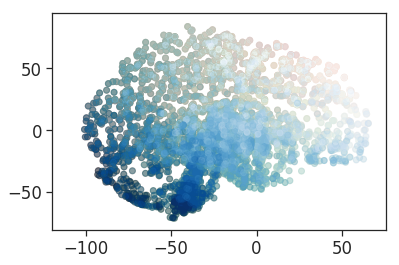

In [159]:
plt.scatter(gdf.mni_nlin_y.values,gdf.mni_nlin_z.values,
           c = gdf.C1_SpatialGradient.values,cmap='Reds',
           alpha=0.3)
plt.scatter(gdf.mni_nlin_y.values,gdf.mni_nlin_z.values,
           c = gdf.C2_SpatialGradient.values,cmap='Greens',
           alpha=0.3)
plt.scatter(gdf.mni_nlin_y.values,gdf.mni_nlin_z.values,
           c = gdf.C3_SpatialGradient.values,cmap='Blues',
           alpha=0.3)
plt.xlim(-120,76)
plt.ylim(-81,95)

In [137]:
code = dict(zip(range(1,11),
               [1,1,1,2,2,2,2,3,3,3]))
conversion = []
for i,row in gdf.iterrows():
    conversion.append('%s%s%s'%(code[row['C1_SpatialGradient']],
                          code[row['C2_SpatialGradient']],
                          code[row['C3_SpatialGradient']]))
code = dict(zip(np.unique(conversion),
               range(1,len(np.unique(conversion))+1)))
gdf.loc[:,'GradExp_Gp'] = [code[x] for x in conversion]

In [138]:
code

{'111': 1,
 '112': 2,
 '121': 3,
 '122': 4,
 '123': 5,
 '132': 6,
 '133': 7,
 '211': 8,
 '212': 9,
 '221': 10,
 '222': 11,
 '223': 12,
 '231': 13,
 '232': 14,
 '233': 15,
 '311': 16,
 '321': 17,
 '322': 18,
 '331': 19,
 '332': 20,
 '333': 21}

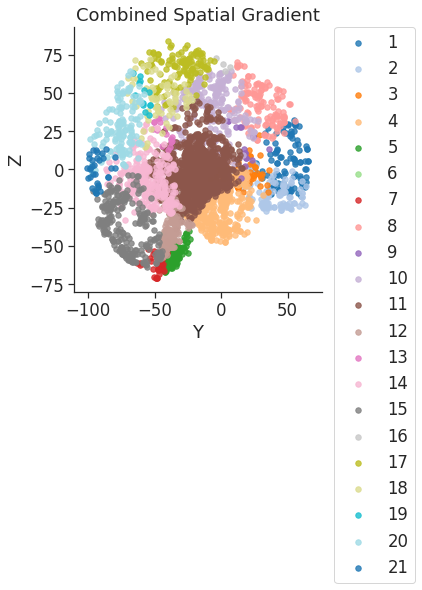

In [139]:
sns.set_context('notebook',font_scale=1.5)
sns.lmplot('mni_nlin_y', 'mni_nlin_z', 
               hue = 'GradExp_Gp',legend=False, 
               data=gdf, fit_reg=False, 
               scatter_kws={"s": 30},
              palette='tab20')
plt.xlabel('Y')
plt.ylabel('Z')
plt.title('Combined Spatial Gradient')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

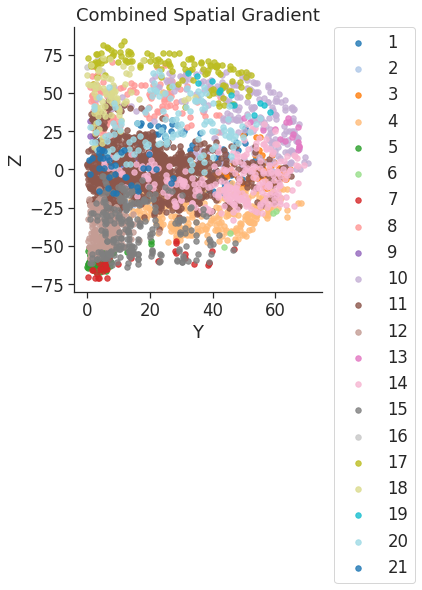

In [163]:
sns.lmplot('abs_mni_nlin_x', 'mni_nlin_z', 
               hue = 'GradExp_Gp',legend=False, 
               data=gdf, fit_reg=False, 
               scatter_kws={"s": 30},
              palette='tab20')
plt.xlabel('Y')
plt.ylabel('Z')
plt.title('Combined Spatial Gradient')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

In [173]:
gdf.Neural_Tube_segment.unique()

array(['Telencephalon', 'Meyelencephalon', 'Diencephalon',
       'Metencelphalon', 'Mesencephalon', nan], dtype=object)

In [184]:
pandas.crosstab(index=gdf[gdf.Neural_Tube_segment=='Telencephalon'].GradExp_Gp,
                columns=gdf[gdf.Neural_Tube_segment=='Telencephalon'].brain_divison)

brain_divison,Anterior_Cingulate,Forebrain,Frontal,Hypothalamus,Insula,Limbic,Occipital,Parietal,Posterior_Cingulate,Sensorimotor,Striatum,Temporal
GradExp_Gp,,,,,,,,,,,,
1,5,0,104,0,2,0,0,0,0,0,0,0
2,20,1,80,0,0,1,0,0,0,0,7,0
3,0,0,35,0,7,0,0,0,0,1,0,28
4,3,23,16,0,17,32,0,0,0,0,13,205
6,0,0,0,0,0,0,0,0,0,0,0,2
8,33,1,99,0,0,0,0,0,0,0,0,0
9,9,0,0,0,0,0,0,0,0,0,8,0
10,7,0,63,0,7,0,0,29,2,109,1,26
11,21,27,0,4,57,236,6,2,31,3,168,108


In [192]:
gdf[gdf.GradExp_Gp==19]['brain_divison'].value_counts()

Parietal    13
Name: brain_divison, dtype: int64

1: (Frontal)
2: (ACC), (Frontal)
3: ((Frontal)), ((Temporal))
4: (Forebrain),(Temporal)
5: Medulla
6: 
7: ((Cerebellum)),((Medulla))
8: (ACC), (Frontal)
9:
10: (Frontal),(Sensorimorot)
11: Midbrain, Thalamus, Hypothalamus, Other_Dien, Insula, Limbic, Striatum, (ACC), (Forebrain),(PCC),(Temporal)
12: Medulla, Pons
13:
14: (Occipital),(Temporal)
15: Cerebellum
16:
17: (Sensorimotor)
18: (Parietal),(PCC)
19: ((Parietal))
20: (Occipital),(Parietal)
21: (Occipital)

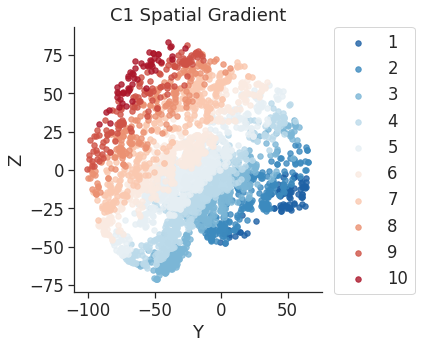

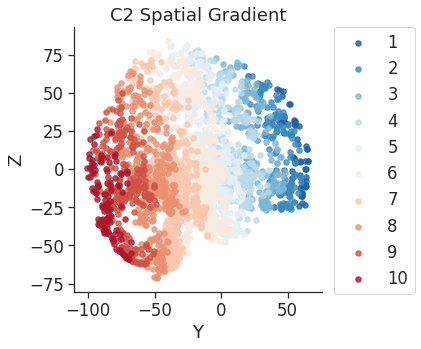

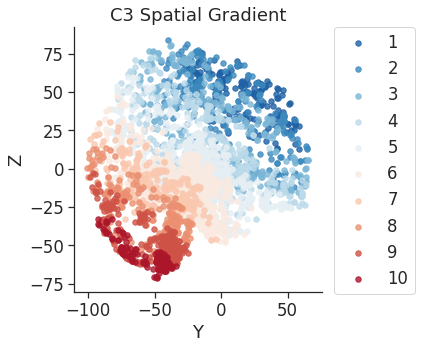

In [164]:
for i in range(pls_mod.y_weights_.shape[0]):
    sg = np.dot(full_y.values,pls_mod.y_weights_[i,:])
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    cut = pandas.cut(scaled_sg,10)
    code = dict(zip(np.unique(cut),range(1,len(np.unique(cut))+1)))
    gdf.loc[:,'C%s_SpatialGradient'%(i+1)] = [code[x] for x in cut]

    sns.lmplot('mni_nlin_y', 'mni_nlin_z', 
               hue = 'C%s_SpatialGradient'%(i+1),legend=False, 
               data=gdf, fit_reg=False, 
               scatter_kws={"s": 30},
              palette='RdBu_r')
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('C%s Spatial Gradient'%(i+1))
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#     plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/C%s_BrainSpatialWB.pdf'%(i+1),
#            bbox_inches='tight')
    plt.show()

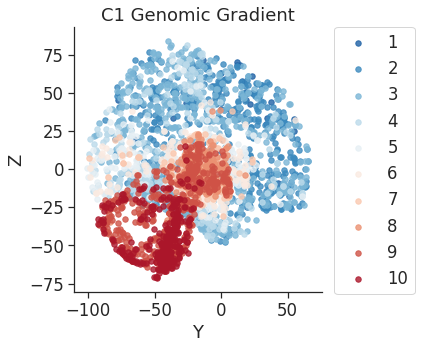

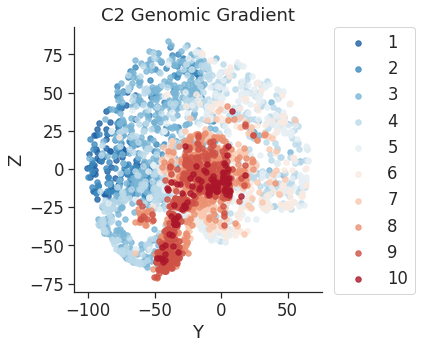

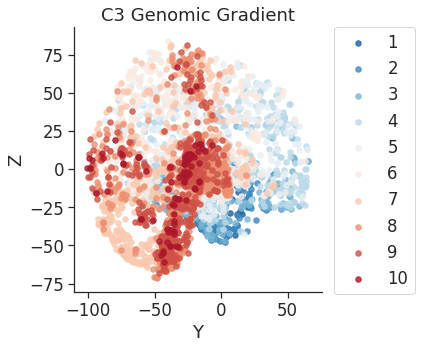

In [169]:
for i in range(pls_mod.y_weights_.shape[0]):
    sg = gdf.loc[:,'Component%s_Expresion'%(i+1)].values
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    cut = pandas.cut(scaled_sg,10)
    code = dict(zip(np.unique(cut),range(1,len(np.unique(cut))+1)))
    gdf.loc[:,'C%s_GCut'%(i+1)] = [code[x] for x in cut]

    sns.lmplot('mni_nlin_y', 'mni_nlin_z', 
               hue = 'C%s_GCut'%(i+1),legend=False, 
               data=gdf, fit_reg=False, 
               scatter_kws={"s": 30},
              palette='RdBu_r')
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('C%s Genomic Gradient'%(i+1))
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show()

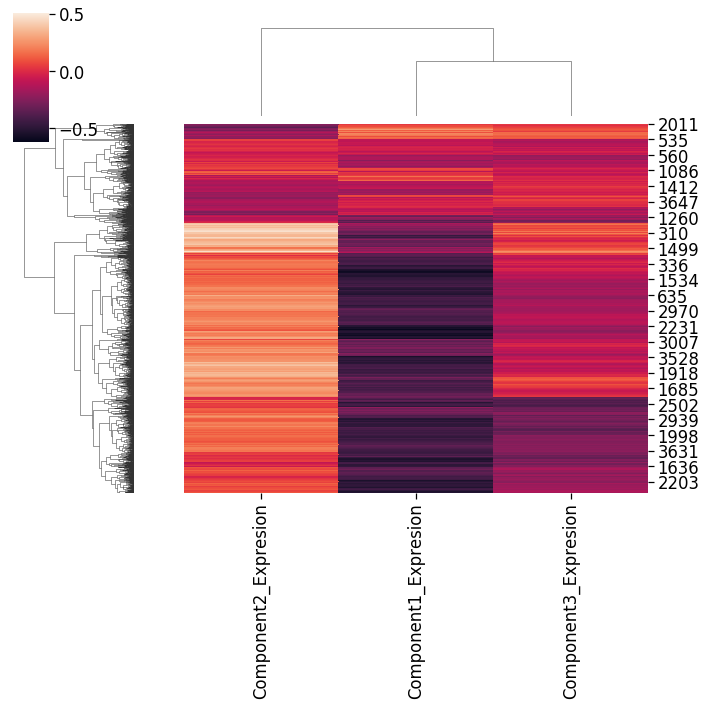

In [30]:
sns.clustermap(gdf[gdf.Neural_Tube_segment=='Telencephalon'
                  ][['Component1_Expresion',
                   'Component2_Expresion',
                   'Component3_Expresion']])